# TF and TF-FVIIa Simulations

## Analysis of TF + POPC:POPS (30:1) simulations

### Protein - Lipid Contacts

Definition of P - L contact: Distance between C-alpha (CA) atom of the protein and the PO4 group of the lipid ≤ 12 Å

This definition is a bit strcit but allows the observation of the more stable or high frequency contacts.
Further analysis may include the direct measurement or identification of hydrogen-bonds between protein and lipids.

The histograms for the PLC will be generated without considering the first 200. A PLC v/ time plot will be generated as well.


In [1]:
## Main ##
import sys 
import os 
import glob
import numpy as np
import scipy as sp
import matplotlib
import matplotlib.gridspec as gridspec
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
import matplotlib.ticker as ticker
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
from pylab import *
from matplotlib.ticker import NullFormatter, MultipleLocator, FormatStrFormatter, FuncFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from gridData import Grid 
from io import StringIO
from collections import Counter
import seaborn as sns
from scipy.stats import norm
from  scipy.stats import gaussian_kde
from sklearn.neighbors import KernelDensity
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf

##Figure fonts and other params ##
##Figure fonts and other params ##
hfont = {'fontname':'Helvetica'}
mpl.rcParams['figure.dpi'] =300
mpl.rcParams.update({'font.size': 16})
mpl.rcParams['pdf.fonttype'] = 42 
plt.rc('font', family='Helvetica')
##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)



In [2]:
### BLOCK AVG --  ##

#(rm1[:,1])

def blockAverage(datastream, isplot=True, maxBlockSize=0):
 
	Nobs         = len(datastream)           # total number of observations in datastream
	minBlockSize = 1;                        # min: 1 observation/block
 
	if maxBlockSize == 0:
		maxBlockSize = int(Nobs/4);        # max: 4 blocs (otherwise can't calc variance)
  
	NumBlocks = maxBlockSize - minBlockSize   # total number of block sizes

	blockMean = np.zeros(NumBlocks)               # mean (expect to be "nearly" constant)
	blockVar  = np.zeros(NumBlocks)               # variance associated with each blockSize
	blockCtr  = 0
	
				#
				#  blockSize is # observations/block
				#  run them through all the possibilities
				#
 
	for blockSize in range(minBlockSize, maxBlockSize):

		Nblock    = int(Nobs/blockSize)               # total number of such blocks in datastream
		obsProp   = np.zeros(Nblock)                  # container for parcelling block 
        
		# Loop to chop datastream into blocks
		# and take average
		for i in range(1,Nblock+1):
			
			ibeg = (i-1) * blockSize
			iend =  ibeg + blockSize
			obsProp[i-1] = np.mean(datastream[ibeg:iend])

		blockMean[blockCtr] = np.mean(obsProp)
		blockVar[blockCtr]  = np.var(obsProp)/(Nblock - 1)
		blockCtr += 1
 
	v = np.arange(minBlockSize,maxBlockSize)
	
	if isplot:
    
		plt.figure( figsize = (12,6)) 
		plt.subplot(1,2,1)
		plt.plot(v, np.sqrt(blockVar),'-',lw=1)
		plt.xlabel('block size')
		plt.ylabel('std')

		plt.subplot(1,2,2)
		plt.errorbar(v, blockMean, np.sqrt(blockVar))
		plt.ylabel('<x>')
		plt.xlabel('block size')

		print (blockMean[-1], np.sqrt(blockVar[-1]))
        
		plt.tight_layout()
		plt.show()
		
	#return v, blockVar, blockMean

In [ ]:
## PLC Script ##

### Load .dat files as string w/o cols 1,2 to count frequency of contacts per residue ##

##NC##
file1 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/PLCT/NC_1us_pcps_PLC_PC_100ps_800ns.dat_hist.dat'
file2 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/PLCT/NC_1us_pcps_PLC_PS_100ps_800ns.dat_hist.dat'

#CL#
file3 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/PLCT/CL_1us_pcps_PLC_PC_100ps_800ns.dat_hist.dat'
file4 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/PLCT/CL_1us_pcps_PLC_PS_100ps_800ns.dat_hist.dat'


#NC_PC#
file7 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/PLCT/NC_1us_pc_PLC_PC_100ps_800ns.dat_hist.dat'

#CL_PC #
file8 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/PLCT/CL_1us_pc_PLC_PC_100ps.dat_hist_800ns.dat'


## TF - FVIIa

## TF_PC
#file9 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_TFPLC_PC_100ps.dat_hist.dat'
## TF_PS
#file10 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_TFPLC_PS_100ps.dat_hist.dat'
## F7_PC
#file11 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_F7PLC_PS_100ps.dat_hist.dat'
## F7_PS
#file12 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_F7PLC_PC_100ps.dat_hist.dat'

## P _ P

## TF - F7
#file13 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_TF_F7_PP_100ps.dat_hist.dat'
## F7 - TF
#file14 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_F7_TF_PP_100ps.dat_hist.dat'

## Fig ##
plt.figure( figsize = (12,12)) 

 ## NC PLC Histogram ##

with open(file1, 'r') as fd:
    lines1 = fd.read().split()    
    counter1 = Counter(lines1)
    items1 = sorted(counter1.items(), key=lambda x: int(x[0]))
    num_items1 = np.array(items1, dtype=int)
    #print(num_items1)
    
with open(file2, 'r') as fd:
    lines2 = fd.read().split()    
    counter2 = Counter(lines2)
    items2 = sorted(counter2.items(), key=lambda x: int(x[0]))
    num_items2 = np.array(items2, dtype=int)    
    
    plt.subplot(221)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('NC - PCPS (1 µs)')
    plt.bar((num_items1[:,0]+2), (num_items1[:,1]/8000), color= 'C0', zorder=1, label='POPC')
    plt.bar((num_items2[:,0]+2), (num_items2[:,1]/8000), color='C2', zorder=2, label='POPS')
    #xticks(np.arange(2, 245, step=20))
    plt.ylim([0, 1])
    plt.xlim([2, 245])   
    plt.legend(loc='lower left', frameon = False)
    plt.annotate('*', xy=(48.5,0.0))
    #plt.annotate('*', xy=(74,0.8))
    plt.annotate('*', xy=(41-1.5,0.8))
    plt.annotate('*', xy=(42-1.5,0.8))
    plt.annotate('*', xy=(43-1.5,0.8))
    plt.annotate('*', xy=(44-1.5,0.8))
    plt.annotate('*', xy=(45-1.5,0.8))
    plt.annotate('*', xy=(55-1.5,0.8))
    plt.annotate('*', xy=(56-1.5,0.8))
    plt.annotate('*', xy=(88-1.5,0.8))
    plt.annotate('*', xy=(155-1.5,0.8))
    plt.annotate('*', xy=(156-1.5,0.8))
    plt.annotate('*', xy=(157-1.5,0.8))
    plt.annotate('*', xy=(158-1.5,0.8))
    plt.annotate('*', xy=(159-1.5,0.8))
    plt.annotate('*', xy=(160-1.5,0.8))
    plt.annotate('*', xy=(161-1.5,0.8))
    plt.annotate('*', xy=(162-1.5,0.8))
    plt.annotate('*', xy=(180-1.5,0.8))
    plt.annotate('*', xy=(182-1.5,0.8))
    plt.annotate('*', xy=(183-1.5,0.8))
    plt.annotate('*', xy=(184-1.5,0.8))
    plt.annotate('*', xy=(185-1.5,0.8))
    plt.annotate('*', xy=(202-1.5,0.8))
    plt.annotate('*', xy=(203-1.5,0.8))
    plt.annotate('*', xy=(204-1.5,0.8))
    plt.annotate('*', xy=(205-1.5,0.8))
    plt.annotate('*', xy=(206-1.5,0.8))
    plt.annotate('*', xy=(207-1.5,0.8))
    plt.annotate('*', xy=(208-1.5,0.8))
    plt.annotate('*', xy=(209-1.5,0.8))
    plt.annotate('*', xy=(210-1.5,0.8))
    plt.annotate('*', xy=(211-1.5,0.8))
    plt.annotate('*', xy=(212-1.5,0.8))
    plt.annotate('*', xy=(213-1.5,0.8))
    plt.annotate('*', xy=(214-1.5,0.8))
    
    
    
 ## CL - pcps PLC Histogram ##

with open(file3, 'r') as fd:
    lines3 = fd.read().split()    
    counter3 = Counter(lines3)
    items3 = sorted(counter3.items(), key=lambda x: int(x[0]))
    num_items3 = np.array(items3, dtype=int)
    #print(num_items3)
    
with open(file4, 'r') as fd:
    lines4 = fd.read().split()    
    counter4 = Counter(lines4)
    items4 = sorted(counter4.items(), key=lambda x: int(x[0]))
    num_items4 = np.array(items4, dtype=int)    
    
    plt.subplot(222)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('CL - PCPS (1 µs)')
    plt.bar((num_items3[:,0]+2), (num_items3[:,1]/8000), color= 'C0', zorder=1)
    plt.bar((num_items4[:,0]+2), (num_items4[:,1]/8000), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])   
    
    #CLpcps_psrn=(num_items4[:,0]+2)
    #CLpcps_psplc=(num_items4[:,1]/8000)
    #CLpcps_ps_table=np.column_stack((CLpcps_psrn,CLpcps_psplc))
    #
    #CLpcps_pcrn=(num_items3[:,0]+2)
    #CLpcps_pcplc=(num_items3[:,1]/8000)
    #CLpcps_pc_table=np.column_stack((CLpcps_pcrn,CLpcps_pcplc))
    

## NC PC ##
with open(file7, 'r') as fd:
    lines7 = fd.read().split()    
    counter7 = Counter(lines7)
    items7 = sorted(counter7.items(), key=lambda x: int(x[0]))
    num_items7 = np.array(items7, dtype=int)    
    #print (num_items7)
    plt.subplot(223)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('NC - PC (1 µs)')
    #plt.bar((num_items5[:,0]+34), (num_items5[:,1]/7268), color= 'gray', zorder=1)
    plt.bar((num_items7[:,0]+2), (num_items7[:,1]/7500), color='C0', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])     
    
## CL PC ##     
    
with open(file8, 'r') as fd:
    lines8 = fd.read().split()    
    counter8 = Counter(lines8)
    items8 = sorted(counter8.items(), key=lambda x: int(x[0]))
    num_items8 = np.array(items8, dtype=int)    
    #print(num_items8)
    plt.subplot(224)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('CL - PC (1 µs)')
    #plt.bar((num_items5[:,0]+34), (num_items5[:,1]/7268), color= 'gray', zorder=1)
    plt.bar((num_items8[:,0]+2), (num_items8[:,1]/8000), color='C0', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])        
    
    #CLpc_rn=(num_items8[:,0]+2)
    #CLpc_plc=(num_items8[:,1]/8000)
    #CLpc_table=np.column_stack((CLpc_rn,CLpc_plc))
    
    
#with np.printoptions(precision=3, suppress=True):
#    print ('CL_pcps_PS')
#    print (CLpcps_ps_table)
#    print ('CL_pcps_PC')
#    print (CLpcps_pc_table)
#    print ('CL_pc_PC')
#    print (CLpc_table)

## TF - TFcl-FVIIa 

#with open(file9, 'r') as fd:
#    lines9 = fd.read().split()[2000:]    
#    counter9 = Counter(lines9)
#    items9 = sorted(counter9.items(), key=lambda x: int(x[0]))
#    num_items9 = np.array(items9, dtype=int)    
#    #print(len(lines9))
#    
#with open(file10, 'r') as fd:
#    lines10 = fd.read().split()[2000:]    
#    counter10 = Counter(lines10)
#    items10 = sorted(counter10.items(), key=lambda x: int(x[0]))
#    num_items10 = np.array(items10, dtype=int)    
#    #print(num_items10)
#    
#    plt.subplot(425)
#    plt.xlabel('Residue number')
#    plt.ylabel('Fraction of sim. time')
#    plt.title('TF - TF-FVIIa (1 µs)')
#    #plt.bar((num_items5[:,0]+34), (num_items5[:,1]/7268), color= 'gray', zorder=1)
#    plt.bar((num_items9[:,0]+2), (num_items9[:,1]/8000), color='C0', zorder=1)
#    plt.bar((num_items10[:,0]+2), (num_items10[:,1]/8000), color='C2', zorder=2)
#    plt.ylim([0, 1])
#    plt.xlim([2, 245])        
#    
## FVIIa - TFcl-FVIIa
#with open(file11, 'r') as fd:
#    lines11 = fd.read().split()[2000:]    
#    counter11 = Counter(lines11)
#    items11 = sorted(counter11.items(), key=lambda x: int(x[0]))
#    num_items11 = np.array(items11, dtype=int)    
#    #print(len(lines9))
#    
#with open(file12, 'r') as fd:
#    lines12 = fd.read().split()[2000:]    
#    counter12 = Counter(lines12)
#    items12 = sorted(counter12.items(), key=lambda x: int(x[0]))
#    num_items12 = np.array(items12, dtype=int)    
#    #print(num_items10)
#    
#    plt.subplot(426)
#    plt.xlabel('Residue number')
#    plt.ylabel('Fraction of sim. time')
#    plt.title('FVIIa - TF-FVIIa (1 µs)')
#    #plt.bar((num_items5[:,0]+34), (num_items5[:,1]/7268), color= 'gray', zorder=1)
#    plt.bar((num_items11[:,0]+2), (num_items11[:,1]/8000), color='C0', zorder=1)
#    plt.bar((num_items12[:,0]+2), (num_items12[:,1]/8000), color='C2', zorder=2)
#    plt.ylim([0, 1])
#    #plt.xlim([2, 245])         
#
### P-P contacts
#
### TF - FVIIa
#
#with open(file13, 'r') as fd:
#    lines13 = fd.read().split()[2000:]    
#    counter13 = Counter(lines13)
#    items13 = sorted(counter13.items(), key=lambda x: int(x[0]))
#    num_items13 = np.array(items13, dtype=int)
#    
#    plt.subplot(427)
#    plt.xlabel('Residue number')
#    plt.ylabel('Fraction of sim. time')
#    plt.title('TF - FVIIa (1 µs)')
#    plt.bar((num_items13[:,0]+2), (num_items13[:,1]/8000), color='C3', zorder=2)
#    plt.ylim([0, 1])
#    plt.xlim([2, 245])    
#    
#    plt.annotate('*', xy=(41-1.5,0.8))
#    plt.annotate('*', xy=(42-1.5,0.8))
#    plt.annotate('*', xy=(43-1.5,0.8))
#    plt.annotate('*', xy=(44-1.5,0.8))
#    plt.annotate('*', xy=(45-1.5,0.8))
#    plt.annotate('*', xy=(55-1.5,0.8))
#    plt.annotate('*', xy=(56-1.5,0.8))
#    plt.annotate('*', xy=(88-1.5,0.8))
#    plt.annotate('*', xy=(155-1.5,0.8))
#    plt.annotate('*', xy=(156-1.5,0.8))
#    plt.annotate('*', xy=(157-1.5,0.8))
#    plt.annotate('*', xy=(158-1.5,0.8))
#    plt.annotate('*', xy=(159-1.5,0.8))
#    plt.annotate('*', xy=(160-1.5,0.8))
#    plt.annotate('*', xy=(161-1.5,0.8))
#    plt.annotate('*', xy=(162-1.5,0.8))
#    plt.annotate('*', xy=(180-1.5,0.8))
#    plt.annotate('*', xy=(182-1.5,0.8))
#    plt.annotate('*', xy=(183-1.5,0.8))
#    plt.annotate('*', xy=(184-1.5,0.8))
#    plt.annotate('*', xy=(185-1.5,0.8))
#    plt.annotate('*', xy=(202-1.5,0.8))
#    plt.annotate('*', xy=(203-1.5,0.8))
#    plt.annotate('*', xy=(204-1.5,0.8))
#    plt.annotate('*', xy=(205-1.5,0.8))
#    plt.annotate('*', xy=(206-1.5,0.8))
#    plt.annotate('*', xy=(207-1.5,0.8))
#    plt.annotate('*', xy=(208-1.5,0.8))
#    plt.annotate('*', xy=(209-1.5,0.8))
#    plt.annotate('*', xy=(210-1.5,0.8))
#    plt.annotate('*', xy=(211-1.5,0.8))
#    plt.annotate('*', xy=(212-1.5,0.8))
#    plt.annotate('*', xy=(213-1.5,0.8))
#    plt.annotate('*', xy=(214-1.5,0.8))
#
### FVIIa - TF
#
#with open(file14, 'r') as fd:
#    lines14 = fd.read().split()[2000:]    
#    counter14 = Counter(lines14)
#    items14 = sorted(counter14.items(), key=lambda x: int(x[0]))
#    num_items14 = np.array(items14, dtype=int)
#    
#    plt.subplot(428)
#    plt.xlabel('Residue number')
#    plt.ylabel('Fraction of sim. time')
#    plt.title('FVIIa - TF (1 µs)')
#    plt.bar((num_items14[:,0]+2), (num_items14[:,1]/8000), color='C4', zorder=2)
#    plt.ylim([0, 1])
#    #plt.xlim([2, 245])     
    
plt.tight_layout()  
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/PLC_NC_CL_PCPS_PC_14052020_wof200ns.pdf", dpi=300)
plt.show()     

### RMSD and Equil. Check ####

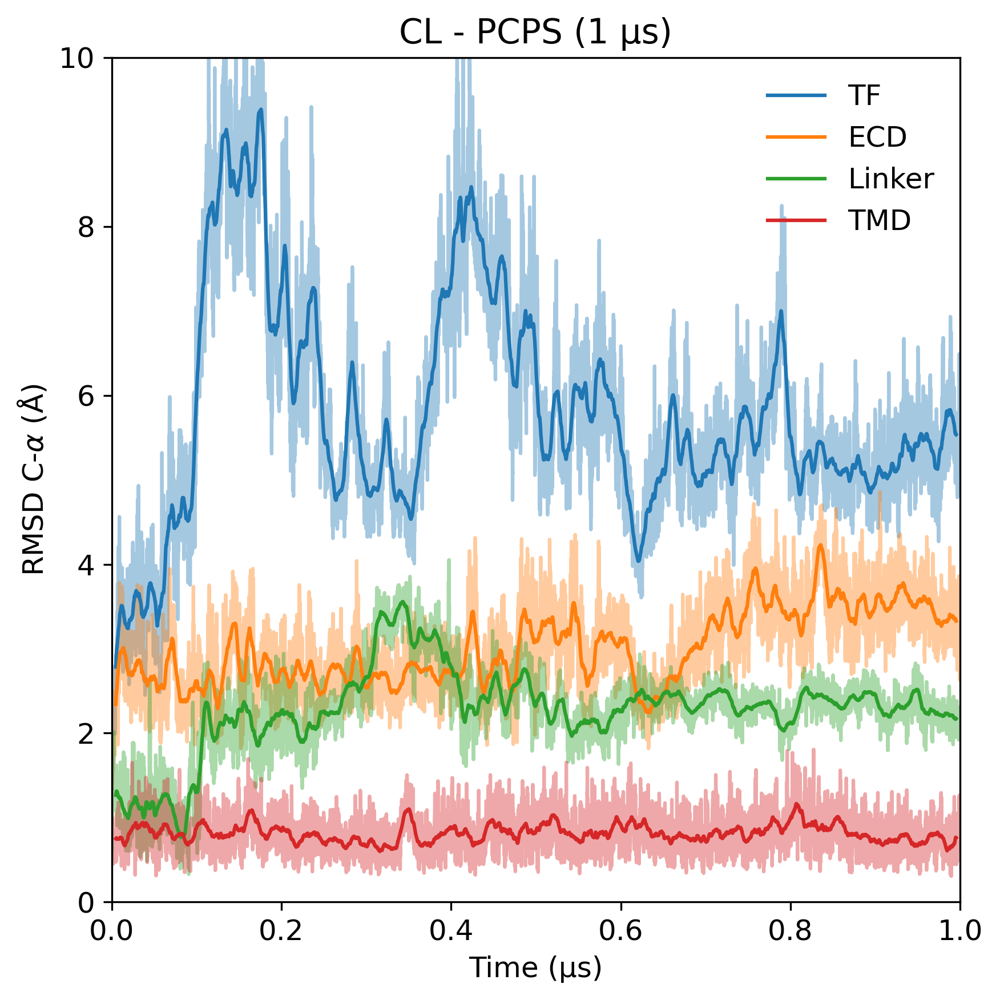

In [26]:
## C-alpha RMSD from TF sims ###

## Column def. #

# Col 0 --> frame
# Col 1 --> RMSD all prot aligned
# Col 2 --> ECD_alprot 
# Col 3 --> tfn_alprot
# Col 4 --> tfc_alprot
# Col 5 --> linker_alprot
# Col 6 --> tmd_altmd
# Col 7 --> prot_alTMD
# Col 8 --> ecd_alTMD
# Col 9 --> ECD_alECD
# Col 10--> TFN_alTFN 
# Col 11--> TFC_alTFN 
# Col 12--> TFC_alTFC 
# Col 13--> TFN_alTFC 
# Col 14--> linker_allinker"

## NC PCPS ##
#ncpcps_rmsd='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TF_NC_PCPS_1us_100ps_RMSD.dat'
#RMSD_NCpcps = np.genfromtxt(ncpcps_rmsd, usecols=(0,1,9,14,6,7))
 
#NC PC#
#ncpc_rmsd='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TF_NC_PC_1_10_100ps_RMSD.dat'
#RMSD_NCpc = np.genfromtxt(ncpc_rmsd, usecols=(0,1,9,14,6,7))

#CL PCPS#
clpcps_rmsd='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TF_CL_PCPS_1_12_100ps_RMSD.dat'
RMSD_CLpcps = np.genfromtxt(clpcps_rmsd, usecols=(0,1,9,14,6,7))

#CL PC#
clpc_rmsd='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TF_CL_PC_1_29_100ps_RMSD.dat'
RMSD_CLpc = np.genfromtxt(clpc_rmsd, usecols=(0,1,9,14,6,8))

## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

## Fig ##

#plt.figure( figsize = (12,12)) 
plt.figure( figsize = (6,6)) 

#NC PCPS ##
#rm1=RMSD_NCpcps
#ma_rm1=np.mean(rolling_window(rm1, 100), 1)
#plt.subplot(221)
#plt.plot((rm1[:,0]*0.0001),rm1[:,1], color='C0', alpha=0.4)
#plt.plot((rm1[:,0]*0.0001),rm1[:,2], color='C1', alpha=0.4)
#plt.plot((rm1[:,0]*0.0001),rm1[:,3], color='C2', alpha=0.4)
#plt.plot((rm1[:,0]*0.0001),rm1[:,4], color='C3', alpha=0.4)
##plt.plot((rm1[:,0]*0.0001),rm1[:,5], color='C4', alpha=0.4)
#plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,1], color='C0', label='TF')
#plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,2], color='C1', label='ECD')
#plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,3], color='C2', label='Linker')
#plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,4], color='C3', label='TMD')
##plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,5], color='C4', label='ECD_alTMD')

#plt.xlim([0, 1])
#plt.ylim([0, 18])
#plt.xlabel('Time (µs)')
#plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
#plt.title('NC - PCPS (1 µs)')
#plt.legend(loc='best', frameon = False)
#
#CL PCPS ##

rm2=RMSD_CLpcps
ma_rm2=np.mean(rolling_window(rm2, 100), 1)
plt.subplot(111)
plt.plot((rm2[:,0]*0.0001),rm2[:,1], color='C0', alpha=0.4)
plt.plot((rm2[:,0]*0.0001),rm2[:,2], color='C1', alpha=0.4)
plt.plot((rm2[:,0]*0.0001),rm2[:,3], color='C2', alpha=0.4)
plt.plot((rm2[:,0]*0.0001),rm2[:,4], color='C3', alpha=0.4)
#plt.plot((rm2[:,0]*0.0001),rm2[:,5], color='C4', alpha=0.4)
plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,1], color='C0',label='TF') 
plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,2], color='C1',label='ECD') 
plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,3], color='C2',label='Linker') 
plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,4], color='C3', label='TMD') 
#plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,5], color='C4')

plt.xlim([0, 1])
plt.ylim([0, 10])
plt.xlabel('Time (µs)')
plt.title('CL - PCPS (1 µs)')
plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
plt.legend(loc='best', frameon = False)

## NC PC ##

#rm3=RMSD_NCpc
#ma_rm3=np.mean(rolling_window(rm3, 100), 1)
#plt.subplot(223)
#plt.plot((rm3[:,0]*0.0001),rm3[:,1], color='C0', alpha=0.4)
#plt.plot((rm3[:,0]*0.0001),rm3[:,2], color='C1', alpha=0.4)
#plt.plot((rm3[:,0]*0.0001),rm3[:,3], color='C2', alpha=0.4)
#plt.plot((rm3[:,0]*0.0001),rm3[:,4], color='C3', alpha=0.4)
#plt.plot((ma_rm3[:,0]*0.0001),ma_rm3[:,1], color='C0')
#plt.plot((ma_rm3[:,0]*0.0001),ma_rm3[:,2], color='C1')
#plt.plot((ma_rm3[:,0]*0.0001),ma_rm3[:,3], color='C2')
#plt.plot((ma_rm3[:,0]*0.0001),ma_rm3[:,4], color='C3')
#
#plt.xlim([0, 1])
#plt.ylim([0, 14])
#plt.xlabel('Time (µs)')
#plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
#plt.title('NC - PC (1 µs)')

## CL PC ## 
#rm4=RMSD_CLpc
#ma_rm4=np.mean(rolling_window(rm4, 100), 1)
#plt.subplot(224)
#plt.plot((rm4[:,0]*0.0001),rm4[:,1], color='C0', alpha=0.4)
#plt.plot((rm4[:,0]*0.0001),rm4[:,2], color='C1', alpha=0.4)
#plt.plot((rm4[:,0]*0.0001),rm4[:,3], color='C2', alpha=0.4)
#plt.plot((rm4[:,0]*0.0001),rm4[:,4], color='C3', alpha=0.4)
#plt.plot((ma_rm4[:,0]*0.0001),ma_rm4[:,1], color='C0')
#plt.plot((ma_rm4[:,0]*0.0001),ma_rm4[:,2], color='C1') 
#plt.plot((ma_rm4[:,0]*0.0001),ma_rm4[:,3], color='C2')
#plt.plot((ma_rm4[:,0]*0.0001),ma_rm4[:,4], color='C3') 
#
#plt.xlim([0, 1])
#plt.ylim([0, 12])
#plt.xlabel('Time (µs)')
#plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
#plt.title('CL - PC (1 µs)')

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/RMSD_CA_NC_CL_PCPS_PC_14052020.pdf", dpi=300)
plt.show()  

In [18]:
### BLOCK AVG -- RMSD ##

#(rm1[:,1])

def blockAverage(datastream, isplot=True, maxBlockSize=0):
 
	Nobs         = len(datastream)           # total number of observations in datastream
	minBlockSize = 1;                        # min: 1 observation/block
 
	if maxBlockSize == 0:
		maxBlockSize = int(Nobs/4);        # max: 4 blocs (otherwise can't calc variance)
  
	NumBlocks = maxBlockSize - minBlockSize   # total number of block sizes

	blockMean = np.zeros(NumBlocks)               # mean (expect to be "nearly" constant)
	blockVar  = np.zeros(NumBlocks)               # variance associated with each blockSize
	blockCtr  = 0
	
				#
				#  blockSize is # observations/block
				#  run them through all the possibilities
				#
 
	for blockSize in range(minBlockSize, maxBlockSize):

		Nblock    = int(Nobs/blockSize)               # total number of such blocks in datastream
		obsProp   = np.zeros(Nblock)                  # container for parcelling block 
        
		# Loop to chop datastream into blocks
		# and take average
		for i in range(1,Nblock+1):
			
			ibeg = (i-1) * blockSize
			iend =  ibeg + blockSize
			obsProp[i-1] = np.mean(datastream[ibeg:iend])

		blockMean[blockCtr] = np.mean(obsProp)
		blockVar[blockCtr]  = np.var(obsProp)/(Nblock - 1)
		blockCtr += 1
 
	v = np.arange(minBlockSize,maxBlockSize)
	
	if isplot:
    
		plt.figure( figsize = (12,6)) 
		plt.subplot(1,2,1)
		plt.plot(v, np.sqrt(blockVar),'-',lw=1)
		plt.xlabel('block size')
		plt.ylabel('std')

		plt.subplot(1,2,2)
		plt.errorbar(v, blockMean, np.sqrt(blockVar))
		plt.ylabel('<x>')
		plt.xlabel('block size')

		print (blockMean[-1], np.sqrt(blockVar[-1]))
        
		plt.tight_layout()
		plt.show()
		
	#return v, blockVar, blockMean

#blockAverage(rm2[:,1],maxBlockSize= 1500)
#blockAverage(rm2[:,4],maxBlockSize= 2000)
#blockAverage(rm2[:,2],maxBlockSize= 2010)

#print (blockVar, blockMean)

### RMSF ###

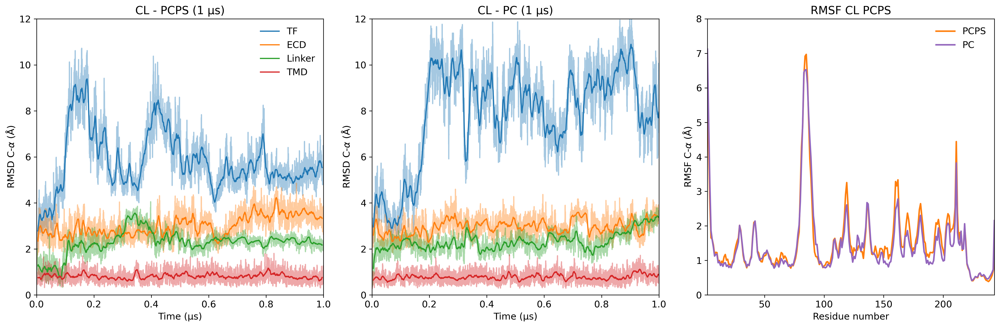

In [37]:
## RMSF -- Ca ###


## NC ##

#ncpcpsECD_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TF_NC_PCPS_1us_100ps_ECD_RMSF.dat'
#ncpcpsLNK_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TF_NC_PCPS_1us_100ps_linker_RMSF.dat'
#ncpcpsTMD_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TF_NC_PCPS_1us_100ps_TMD_RMSF.dat'
#
#NCPCPSecd_RMSF=(np.genfromtxt(ncpcpsECD_rmsf))
#NCPCPSlnk_RMSF=(np.genfromtxt(ncpcpsLNK_rmsf))
#NCPCPStmd_RMSF=(np.genfromtxt(ncpcpsTMD_rmsf)) 
#
#NCPCPS_RMSF= np.concatenate((NCPCPSecd_RMSF,NCPCPSlnk_RMSF,NCPCPStmd_RMSF))
#
#ncpcECD_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TF_NC_PC_1us_100ps_ECD_RMSF.dat'
#ncpcLNK_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TF_NC_PC_1us_100ps_linker_RMSF.dat'
#ncpcTMD_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TF_NC_PC_1us_100ps_TMD_RMSF.dat'
#
#NCPCecd_RMSF=(np.genfromtxt(ncpcECD_rmsf))
#NCPClnk_RMSF=(np.genfromtxt(ncpcLNK_rmsf))
#NCPCtmd_RMSF=(np.genfromtxt(ncpcTMD_rmsf)) 
#
#NCPC_RMSF= np.concatenate((NCPCecd_RMSF,NCPClnk_RMSF,NCPCtmd_RMSF))

## CL ##

clpcpsECD_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TF_CL_PCPS_1us_100ps_ECD_RMSF.dat'
clpcpsLNK_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TF_CL_PCPS_1us_100ps_linker_RMSF.dat'
clpcpsTMD_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TF_CL_PCPS_1us_100ps_TMD_RMSF.dat'

CLPCPSecd_RMSF=(np.genfromtxt(clpcpsECD_rmsf))
CLPCPSlnk_RMSF=(np.genfromtxt(clpcpsLNK_rmsf))
CLPCPStmd_RMSF=(np.genfromtxt(clpcpsTMD_rmsf)) 

CLPCPS_RMSF= np.concatenate((CLPCPSecd_RMSF,CLPCPSlnk_RMSF,CLPCPStmd_RMSF))

clpcECD_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TF_CL_PC_0d5us_100ps_ECD_RMSF.dat'
clpcLNK_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TF_CL_PC_0d5us_100ps_linker_RMSF.dat'
clpcTMD_rmsf='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TF_CL_PC_0d5us_100ps_TMD_RMSF.dat'

CLPCecd_RMSF=(np.genfromtxt(clpcECD_rmsf))
CLPClnk_RMSF=(np.genfromtxt(clpcLNK_rmsf))
CLPCtmd_RMSF=(np.genfromtxt(clpcTMD_rmsf)) 
#
CLPC_RMSF= np.concatenate((CLPCecd_RMSF,CLPClnk_RMSF,CLPCtmd_RMSF))
#


#print (NCPCPS_RMSF)

## CLPCPS ###

plt.figure( figsize = (18,6)) 

#RMSF
plt.subplot(133)
y = CLPCPS_RMSF; x = arange(y.size)+2; 
y2 = CLPC_RMSF; x2 = arange(y2.size)+2; 
plt.plot(x,CLPCPS_RMSF, color='C1', label='PCPS', lw=2)
plt.plot(x2,CLPC_RMSF, color='C4', label='PC', lw=2)
plt.xlim([2, 243])
plt.ylim([0, 8])
#plt.yticks(np.arange(0, 10, 2))
#plt.ticklabel_format(axis='y',useOffset=1)
plt.legend(loc='best', frameon = False)
plt.title('RMSF CL PCPS')
plt.xlabel('Residue number')
plt.ylabel('RMSF C-' r'$\alpha$' ' (Å)')

#RMSD

rm2=RMSD_CLpcps
ma_rm2=np.mean(rolling_window(rm2, 100), 1)
plt.subplot(131)
plt.plot((rm2[:,0]*0.0001),rm2[:,1], color='C0', alpha=0.4)
plt.plot((rm2[:,0]*0.0001),rm2[:,2], color='C1', alpha=0.4)
plt.plot((rm2[:,0]*0.0001),rm2[:,3], color='C2', alpha=0.4)
plt.plot((rm2[:,0]*0.0001),rm2[:,4], color='C3', alpha=0.4)
#plt.plot((rm2[:,0]*0.0001),rm2[:,5], color='C4', alpha=0.4)
plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,1], color='C0',label='TF') 
plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,2], color='C1',label='ECD') 
plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,3], color='C2',label='Linker') 
plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,4], color='C3', label='TMD') 
#plt.plot((ma_rm2[:,0]*0.0001),ma_rm2[:,5], color='C4')

plt.xlim([0, 1])
plt.ylim([0, 12])
#plt.yticks(np.arange(0, 10, 2))
plt.xlabel('Time (µs)')
plt.title('CL - PCPS (1 µs)')
plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
plt.legend(loc='best', frameon = False)

## CLPC ###
    
#RMSF
#plt.subplot(224)
#y2 = CLPC_RMSF; x2 = arange(y2.size)+2; 
##plt.plot(x2,NCPC_RMSF, color='C3', label='NC', lw=2)
#plt.plot(x2,CLPC_RMSF, color='C4', label='CL', lw=2)
#plt.xlim([2, 243])
#plt.yticks(np.arange(0, 9, 2))
#plt.legend(loc='best', frameon = False)
#plt.title('RMSF CL PC')
#plt.xlabel('Residue number')
#plt.ylabel('RMSF C-' r'$\alpha$' ' (Å)')

#RMSD
rm4=RMSD_CLpc
ma_rm4=np.mean(rolling_window(rm4, 100), 1)
plt.subplot(132)
plt.plot((rm4[:,0]*0.0001),rm4[:,1], color='C0', alpha=0.4)
plt.plot((rm4[:,0]*0.0001),rm4[:,2], color='C1', alpha=0.4)
plt.plot((rm4[:,0]*0.0001),rm4[:,3], color='C2', alpha=0.4)
plt.plot((rm4[:,0]*0.0001),rm4[:,4], color='C3', alpha=0.4)
plt.plot((ma_rm4[:,0]*0.0001),ma_rm4[:,1], color='C0')
plt.plot((ma_rm4[:,0]*0.0001),ma_rm4[:,2], color='C1') 
plt.plot((ma_rm4[:,0]*0.0001),ma_rm4[:,3], color='C2')
plt.plot((ma_rm4[:,0]*0.0001),ma_rm4[:,4], color='C3') 
#
plt.xlim([0, 1])
plt.ylim([0, 12])
plt.xlabel('Time (µs)')
plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
plt.title('CL - PC (1 µs)')

#plt.subplot(313)
#y2 = NCPC_RMSF; x2 = arange(y2.size)+34; 
#plt.plot(x,CLPCPS_RMSF, color='C1', label='CLpcps', lw=2)
#plt.plot(x2,CLPC_RMSF, color='C4', label='CLpc', lw=2)
#plt.xlim([33, 277])
#plt.yticks(np.arange(0, 9, 2))
#plt.legend(loc='best', frameon = False)
#plt.title('RMSF NC - CL PC')
#plt.xlabel('Residue number')
#plt.ylabel('RMSF C-' r'$\alpha$' ' (Å)')

plt.tight_layout()  
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/RMSF_RMSD_CA_CL_PCPS_PC_081020.pdf", dpi=300)
plt.show()  



### TF orientation 

Measurement of the angle between the Cter domain of TF (TFC) asd the z-axis (perpendicullar to the membrane plane). For this analysis the TMD was used to aling the trjs in order to remove rotations and translations. I also measured the ECD v/ Z-axis angle for comparison.

In [ ]:
### TFC v X  angle

#NC-pcps
file2x= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TFCangle/new/NC_PCPSna_TFCangle_1us_500ps_2.dat'
fileax = np.genfromtxt(file2x, usecols=(0,4))                                             

#CL-pcps
file3x = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TFCangle/new/CL_PCPS_TFCangle_1us_500ps_2.dat'
filebx = np.genfromtxt(file3x, usecols=(0,4))

#NC-pc
file4x ='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TFCangle/new/NC_PCna_TFCangle_1us_500ps_2.dat'
filecx = np.genfromtxt(file4x, usecols=(0,4))

#CL-pc
file5x = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TFCangle/new/CL_PCna_TFCangle_1us_500ps_2.dat'
filedx = np.genfromtxt(file5x, usecols=(0,4))

#TF of FVIIaa_TFcl ##
#file6x = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/angle/TFfviia_PCna_TFCangle_1us_500ps_2.dat'
#fileex = np.genfromtxt(file6x, usecols=(0,4))

## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

## Eq
file2_eqx = np.genfromtxt(file2x, usecols=(0,4), skip_header=399)
file3_eqx = np.genfromtxt(file3x, usecols=(0,4), skip_header=399)
file4_eqx = np.genfromtxt(file4x, usecols=(0,4), skip_header=399)
file5_eqx = np.genfromtxt(file5x, usecols=(0,4), skip_header=399)
#file6_eqx = np.genfromtxt(file6x, usecols=(0,4), skip_header=399)

## Fig ##

plt.figure( figsize = (12,24)) 

#CLpcps
df3x=filebx
ma3x=np.mean(rolling_window(df3x, 20), 1)
plt.subplot(421)
plt.plot((df3x[:,0]*0.0005),(df3x[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma3x[:,0]*0.0005),(ma3x[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
#plt.ylim([0, 180])
plt.ylabel('TFCx angle (deg.)')
plt.title('CL - PCPS (1 µs)')

df3_eqx=file3_eqx 
plt.subplot(422)
sns.distplot((df3_eqx[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCx angle (deg.)')
plt.ylabel('Probability density')
plt.title('CL - PCPS (1 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.03])

#CLpc
df5x=filedx
ma5x=np.mean(rolling_window(df5x, 20), 1)
plt.subplot(423)
plt.plot((df5x[:,0]*0.0005),(180-(df5x[:,1]*57.2958)), color='gray', alpha=0.5)
plt.plot((ma5x[:,0]*0.0005),(180-(ma5x[:,1]*57.2958)), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 180])
plt.ylabel('TFCx angle (deg.)')
plt.title('CL - PC (0.5 µs)')

df5_eqx=file5_eqx 
plt.subplot(424)
sns.distplot((180-(df5_eqx[:,1]*57.2958)), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCx angle (deg.)')
plt.ylabel('Probability density')
plt.title('CL - PC (0.5 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.03])

#NCpcps
df1x=fileax
ma1x=np.mean(rolling_window(df1x, 20), 1)
plt.subplot(425)
plt.plot((df1x[:,0]*0.0005),(df1x[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma1x[:,0]*0.0005),(ma1x[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 180])
plt.ylabel('TFCx angle (deg.)')
plt.title('NC - PCPS (1 µs)')

df1_eqx=file2_eqx 
plt.subplot(426)
sns.distplot((df1_eqx[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCx angle (deg.)')
plt.ylabel('Probability density')
plt.title('NC - PCPS (1 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.03])

#NCpc
df4x=filecx
ma4x=np.mean(rolling_window(df4x, 20), 1)
plt.subplot(427)
plt.plot((df4x[:,0]*0.0005),(df4x[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma4x[:,0]*0.0005),(ma4x[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 180])
plt.ylabel('TFCx angle (deg.)')
plt.title('NC - PC (1 µs)')

df4_eqx=file4_eqx 
plt.subplot(428)
sns.distplot((df4_eqx[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCx angle (deg.)')
plt.ylabel('Probability density')
plt.title('NC - PC (1 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.03])

## TF of FVIIa_TFcl

#df6x=fileex
#ma6x=np.mean(rolling_window(df6x, 20), 1)
#plt.subplot(529)
#plt.plot((df6x[:,0]*0.0005),(df6x[:,1]*57.2958), color='gray', alpha=0.5)
#plt.plot((ma6x[:,0]*0.0005),(ma6x[:,1]*57.2958), color='red')
#plt.xlabel('Time (µs)')
#plt.xlim([0, 1])
#plt.ylim([0, 180])
#plt.ylabel('TFCx angle (deg.)')
#plt.title('TF(fviia) - PC (1 µs)')
#
#df6_eqx=file6_eqx 
#plt.subplot(5,2,10)
#sns.distplot((df6_eqx[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
#plt.xlabel('TFCx angle (deg.)')
#plt.ylabel('Probability density')
#plt.title('NC - PC (1 µs)')
#plt.xlim([0, 180])
#plt.ylim([0, 0.025])
#
plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/TFCangleX_CL_NC_pcps_pc_wof200ns_140520.pdf", dpi=300)
plt.show()




In [ ]:
blockAverage(df3_eqx[:,1]*57.2958,maxBlockSize=300)
blockAverage(df5_eqx[:,1]*57.2958,maxBlockSize=250)
blockAverage(df1_eqx[:,1]*57.2958,maxBlockSize=250)
blockAverage(df4_eqx[:,1]*57.2958,maxBlockSize=200)

In [ ]:
### TFC v Z  angle

#NC-pcps
file2z= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TFCangle/new/NC_PCPSna_TFCangle_1us_500ps_2.dat'
fileaz = np.genfromtxt(file2z, usecols=(0,3))                                             

#CL-pcps
file3z = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TFCangle/new/CL_PCPS_TFCangle_1us_500ps_2.dat'
filebz = np.genfromtxt(file3z, usecols=(0,3))

#NC-pc
file4z ='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TFCangle/new/NC_PCna_TFCangle_1us_500ps_2.dat'
filecz = np.genfromtxt(file4z, usecols=(0,3))

#CL-pc
file5z = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TFCangle/new/CL_PCna_TFCangle_1us_500ps_2.dat'
filedz = np.genfromtxt(file5z, usecols=(0,3))

#TF of FVIIaa_TFcl ##
#file6z = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/angle/TFfviia_PCna_TFCangle_1us_500ps_2.dat'
#fileez = np.genfromtxt(file6z, usecols=(0,3))

## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

## Eq
file2_eqz = np.genfromtxt(file2z, usecols=(0,3), skip_header=399)
file3_eqz = np.genfromtxt(file3z, usecols=(0,3), skip_header=399)
file4_eqz = np.genfromtxt(file4z, usecols=(0,3), skip_header=399)
file5_eqz = np.genfromtxt(file5z, usecols=(0,3), skip_header=399)
#file6_eqz = np.genfromtxt(file6z, usecols=(0,3), skip_header=399)

## Fig ##

plt.figure( figsize = (12,24)) 

#CLpcps
df3z=filebz
ma3z=np.mean(rolling_window(df3z, 20), 1)
plt.subplot(421)
plt.plot((df3z[:,0]*0.0005),(df3z[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma3z[:,0]*0.0005),(ma3z[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 90])
plt.ylabel('TFCz angle (deg.)')
plt.title('CL - PCPS (1 µs)')

df3_eqz=file3_eqz 
plt.subplot(422)
sns.distplot((df3_eqz[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCz angle (deg.)')
plt.ylabel('Probability density')
plt.title('CL - PCPS (1 µs)')
plt.xlim([0, 90])
plt.ylim([0, 0.04])

#CLpc
df5z=filedz
ma5z=np.mean(rolling_window(df5z, 20), 1)
plt.subplot(423)
plt.plot((df5z[:,0]*0.0005),(df5z[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma5z[:,0]*0.0005),(ma5z[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 90])
plt.ylabel('TFCz angle (deg.)')
plt.title('CL - PC (0.5 µs)')

df5_eqz=file5_eqz 
plt.subplot(424)
sns.distplot((df5_eqz[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCz angle (deg.)')
plt.ylabel('Probability density')
plt.title('CL - PC (0.5 µs)')
plt.xlim([0, 90])
plt.ylim([0, 0.04])

#NCpcps
df1z=fileaz
ma1z=np.mean(rolling_window(df1z, 20), 1)
plt.subplot(425)
plt.plot((df1z[:,0]*0.0005),(df1z[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma1z[:,0]*0.0005),(ma1z[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 90])
plt.ylabel('TFCz angle (deg.)')
plt.title('NC - PCPS (1 µs)')

df1_eqz=file2_eqz 
plt.subplot(426)
sns.distplot((df1_eqz[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCz angle (deg.)')
plt.ylabel('Probability density')
plt.title('NC - PCPS (1 µs)')
plt.xlim([0, 90])
plt.ylim([0, 0.04])

#NCpc
df4z=filecz
ma4z=np.mean(rolling_window(df4z, 20), 1)
plt.subplot(427)
plt.plot((df4z[:,0]*0.0005),(df4z[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma4z[:,0]*0.0005),(ma4z[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 90])
plt.ylabel('TFCz angle (deg.)')
plt.title('NC - PC (1 µs)')

df4_eqz=file4_eqz
plt.subplot(428)
sns.distplot((df4_eqz[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCz angle (deg.)')
plt.ylabel('Probability density')
plt.title('NC - PC (1 µs)')
plt.xlim([0, 90])
plt.ylim([0, 0.04])

## TF of FVIIa_TFcl

#df6z=fileez
#ma6z=np.mean(rolling_window(df6z, 20), 1)
#plt.subplot(529)
#plt.plot((df6z[:,0]*0.0005),(df6z[:,1]*57.2958), color='gray', alpha=0.5)
#plt.plot((ma6z[:,0]*0.0005),(ma6z[:,1]*57.2958), color='red')
#plt.xlabel('Time (µs)')
#plt.xlim([0, 1])
#plt.ylim([0, 90])
#plt.ylabel('TFCz angle (deg.)')
#plt.title('TF(fviia) - PC (1 µs)')
#
#df6_eqz=file6_eqz 
#plt.subplot(5,2,10)
#sns.distplot((df6_eqz[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
#plt.xlabel('TFCz angle (deg.)')
#plt.ylabel('Probability density')
#plt.title('NC - PC (1 µs)')
#plt.xlim([0, 90])
##plt.ylim([0, 0.025])
#
plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/TFCangleX_CL_NC_pcps_pc_wof200ns_070420.pdf", dpi=300)
plt.show()




In [ ]:
blockAverage(df3_eqz[:,1]*57.2958,maxBlockSize=150)
blockAverage(df5_eqz[:,1]*57.2958,maxBlockSize=250)
blockAverage(df1_eqz[:,1]*57.2958,maxBlockSize=250)
blockAverage(df4_eqz[:,1]*57.2958,maxBlockSize=250)


In [51]:
## TFN-TFC angle for CL and NC PCPS ###

CLpcps_NCang = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TFCangle/CL_PCPS_TFN_TFC_angle_1us_500ps.dat'
CLpc_NCang   = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TFCangle/CL_PC_TFN_TFC_angle_1us_500ps.dat'

#NCpcps_NCang = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/'
#NCpc_NCang   = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/'

CLpcps_NCang_proc = np.genfromtxt(CLpcps_NCang, usecols=(0,1))
CLpc_NCang_proc = np.genfromtxt(CLpc_NCang, usecols=(0,1))

#NCpcps_NCang_proc = np.genfromtxt(NCpcps_NCang, usecols=(0,1))
#NCpc_NCang_proc   = np.genfromtxt(NCpc_NCang, usecols=(0,1))

## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

## Eq
CLpcps_NCang_eq = np.genfromtxt(CLpcps_NCang, usecols=(0,1), skip_header=399)
CLpc_NCang_eq = np.genfromtxt(CLpc_NCang, usecols=(0,1), skip_header=399)

#NCpcps_NCang_eq = np.genfromtxt(NCpcps_NCang, usecols=(0,1), skip_header=399)
#NCpc_NCang_eq = np.genfromtxt(NCpc_NCang, usecols=(0,1), skip_header=399)

plt.figure( figsize = (12,6)) 

#CL_PCPS
df10=CLpcps_NCang_proc
ma10=np.mean(rolling_window(df10, 20), 1)
plt.subplot(221)
plt.plot((df10[:,0]*0.0005),df10[:,1], color='gray', alpha=0.5)
plt.plot((ma10[:,0]*0.0005),ma10[:,1], color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
#plt.ylim([90, 160])
plt.ylabel('TFN-TFC angle (deg.)')
plt.title('CL - PCPS (1 µs)')

df10_eq=CLpcps_NCang_eq 
plt.subplot(222)
sns.distplot(df10_eq[:,1], bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFN-TFC angle (deg.)')
plt.ylabel('Probability density')
plt.title('CL - PCPS (1 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.06])

#CL_PC

df11=CLpc_NCang_proc
ma11=np.mean(rolling_window(df10, 20), 1)
plt.subplot(223)
plt.plot((df11[:,0]*0.0005),df11[:,1], color='gray', alpha=0.5)
plt.plot((ma11[:,0]*0.0005),ma11[:,1], color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
#plt.ylim([90, 160])
plt.ylabel('TFN-TFC angle (deg.)')
plt.title('CL - PC (1 µs)')

df11_eq=CLpc_NCang_eq 
plt.subplot(224)
sns.distplot(df11_eq[:,1], bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFN-TFC angle (deg.)')
plt.ylabel('Probability density')
plt.title('CL - PCPS (1 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.06])

# NC_PCPS


# NC_PC

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/TFCangleX_CL_NC_pcps_pc_wof200ns_070420.pdf", dpi=300)
plt.show()

OSError: /media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TFCangle/CL_PC_TFN_TFC_angle_1us_500ps.dat not found.

In [ ]:
## ECD-x angle for comparison w/NR

file2Ex= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TFCangle/NC_PCPS_ECDangle_1us_500ps.dat'
fileaEx = np.genfromtxt(file2Ex, usecols=(0,4))

file3Ex = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TFCangle/CL_PCPS_ECDangle_1us_500ps.dat'
filebEx = np.genfromtxt(file3Ex, usecols=(0,4))

file4Ex= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/TFCangle/NC_PC_ECDangle_1us_500ps.dat'
filecEx = np.genfromtxt(file4Ex, usecols=(0,4))

file5Ex = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/TFCangle/CL_PC_ECDangle_500ps.dat'
filedEx = np.genfromtxt(file5Ex, usecols=(0,4))

## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

## Eq
file2E_eqx = np.genfromtxt(file2Ex, usecols=(0,4), skip_header=399)
file3E_eqx = np.genfromtxt(file3Ex, usecols=(0,4), skip_header=399)
file4E_eqx = np.genfromtxt(file4Ex, usecols=(0,4), skip_header=399)
file5E_eqx = np.genfromtxt(file5Ex, usecols=(0,4), skip_header=399)

## Fig ##

plt.figure( figsize = (12,24)) 

#CL PCPS

df2x=filebEx
ma2x=np.mean(rolling_window(df2x, 20), 1)
plt.subplot(421)
plt.plot((df2x[:,0]*0.0005),df2x[:,1], color='gray', alpha=0.5)
plt.plot((ma2x[:,0]*0.0005),ma2x[:,1], color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 180])
plt.ylabel('ECDx angle (deg.)')
plt.title('CL - PCPS (1 µs)')

df2_eqx=file3E_eqx 
plt.subplot(422)
sns.distplot(df2_eqx[:,1], bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('ECDx angle (deg.)')
plt.ylabel('Probability density')
plt.title('CL - PCPS (1 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.035])

#NC PCPS

df1x=fileaEx
ma1x=np.mean(rolling_window(df1x, 20), 1)
plt.subplot(423)
plt.plot((df1x[:,0]*0.0005),df1x[:,1], color='gray', alpha=0.5)
plt.plot((ma1x[:,0]*0.0005),ma1x[:,1], color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 180])
plt.ylabel('ECDx angle (deg.)')
plt.title('NC - PCPS (1 µs)')

df1_eqx=file2E_eqx 
plt.subplot(424)
sns.distplot(df1_eqx[:,1], bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('ECDx angle (deg.)')
plt.ylabel('Probability density')
plt.title('NC - PCPS (1 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.025])

# CL PC 
df3x=filedEx
ma3x=np.mean(rolling_window(df3x, 20), 1)
plt.subplot(425)
plt.plot((df3x[:,0]*0.0005),df3x[:,1], color='gray', alpha=0.5)
plt.plot((ma3x[:,0]*0.0005),ma3x[:,1], color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 0.5])
plt.ylim([0, 180])
plt.ylabel('ECDx angle (deg.)')
plt.title('CL - PC (0.5 µs)')

df3_eqx=file5E_eqx 
plt.subplot(426)
sns.distplot(df3_eqx[:,1], bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('ECDx angle (deg.)')
plt.ylabel('Probability density')
plt.title('CL - PC (0.5 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.035])

#NC PC
df4x=filecEx
ma4x=np.mean(rolling_window(df4x, 20), 1)
plt.subplot(427)
plt.plot((df4x[:,0]*0.0005),df4x[:,1], color='gray', alpha=0.5)
plt.plot((ma4x[:,0]*0.0005),ma4x[:,1], color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([0, 180])
plt.ylabel('ECDx angle (deg.)')
plt.title('NC - PC (1 µs)')

df5_eqx=file4E_eqx 
plt.subplot(428)
sns.distplot(df5_eqx[:,1], bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('ECDx angle (deg.)')
plt.ylabel('Probability density')
plt.title('NC - PC (1 µs)')
plt.xlim([0, 180])
plt.ylim([0, 0.025])


plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/ECDangleX_CL_NC_pcps_pc_020420.pdf", dpi=300)
plt.show()





In [ ]:
## BA ECD-x angle 


blockAverage(df2_eqx[:,1],maxBlockSize=250)
blockAverage(df1_eqx[:,1],maxBlockSize=300)
blockAverage(df3_eqx[:,1],maxBlockSize=300)
blockAverage(df5_eqx[:,1],maxBlockSize=300)


### Avg. Density maps of protein and lipids during the TF + PC:PS simulations

These maps have a dual purpose: First, compare the protein "thickness" over the membrane with the NR results and second, observe the formation of PS "domains" around TF. 

In [ ]:

## Load density maps ##

## Protein density ## 
gsE=[]
nameE=[]
gsF=[]
nameF=[]
dirsE = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/dens/*_pcps_*ECDdens.dx', recursive=True))
dirsF = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/dens/*_pc_*ECDdens.dx', recursive=True))

gsG=[]
nameG=[]
gsH=[]
nameH=[]
dirsG = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/dens/*_pcps_*ECDdens.dx', recursive=True))
dirsH = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/dens/*_pc_*ECDdens.dx', recursive=True))

for numE, file in enumerate(dirsE):
    gsE.append(Grid(file))
    nameE.append(file.split('_p')[-1])
for numF, file in enumerate(dirsF):
    gsF.append(Grid(file))
    nameF.append(file.split('_p')[-1])    
for numG, file in enumerate(dirsG):
    gsG.append(Grid(file))
    nameG.append(file.split('_p')[-1])
for numH, file in enumerate(dirsH):
    gsH.append(Grid(file))
    nameH.append(file.split('_p')[-1])        
    
print (nameE)
print (nameF)
print (nameG)
print (nameH)

## PO4 Density ##
#origin= (-16.75 -17.25 26.25)
#delta= 0.5
#gsP=[]
#nameP=[]
#dirsP = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/**/dens/*Pdens.dx', recursive=True))
#print(dirsP)
#for numP, file in enumerate(dirsP):
#    gsP.append(Grid(file, origin=origin, delta=delta))
#    nameP.append(file.split('100ps')[-1])
#    print(nameP)    
    
    

In [ ]:

## Plot the 2D and prot_density ##

#norm = cm.colors.Normalize(vmax = 0.3)
plt.figure( figsize = (12,12) )


 #fname=nameE[i]
#print(fname)
plt.subplot(221)
gridE = gsE[0].grid
sum_vecE = np.sum(gridE, axis=1)
rotE = np.rot90(sum_vecE)    
cfE = plt.contourf(rotE, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
plt.colorbar( cfE )
plt.title('NC - PCPS avg. ECD dens.(xz)')
plt.xlim([0, 150])
plt.ylim([0, 120])

plt.subplot(222)
gridG = gsG[0].grid
sum_vecG = np.sum(gridG, axis=1)
rotG = np.rot90(sum_vecG)    
cfG = plt.contourf(rotG, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
plt.colorbar( cfG )
plt.title('CL - PCPS avg. ECD dens.(xz)')
plt.xlim([0, 150])
plt.ylim([0, 120])

plt.subplot(223)
gridF = gsF[0].grid
sum_vecF = np.sum(gridF, axis=1)
rotF = np.rot90(sum_vecF)    
cfF = plt.contourf(rotF, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
plt.colorbar( cfF )
plt.title('NC - PC avg. ECD dens.(xz)')
plt.xlim([0, 150])
plt.ylim([0, 120])

plt.subplot(224)
gridH = gsH[0].grid
sum_vecH = np.sum(gridH, axis=1)
rotH = np.rot90(sum_vecH)    
cfH = plt.contourf(rotH, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
plt.colorbar( cfH )
plt.title('CL - PC avg. ECD dens.(xz)')
plt.xlim([0, 150])
plt.ylim([0, 120])


plt.tight_layout()    
#plt.savefig("/home/raul/projects/MD-runs/synergy/SPTMRs/PRLR/CG/results/PRLR_LID_cgm2_prot_dens_noname.pdf", dpi=300)
plt.show()

In [ ]:
plt.subplot(121)
gridE = gsE[0].grid
sum_vecE= np.sum(gridE, axis=(0,1))
#sum_vecE2 = np.sum_along_axis(sum_vecE, axis=0)
#rotE = np.rot90(sum_vecE)    
#cfE = plt.contourf(rotE, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
#plt.colorbar( cfE )
#plt.title('NC - PCPS avg. ECD dens.(xz)')
#plt.xlim([0, 150])
#plt.ylim([0, 120])
#plt.subplot(122)
plt.plot(sum_vecE)
print(sum_vecE)

#plt.tight_layout() 
plt.show()

In [ ]:
## 2D PS density maps (XY plane)

norm = cm.colors.Normalize(vmax=0.1)

# CL PCPS

CLpcps_PS = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/dens/CL_1us_pcps_s200ns_200ps_HGPSdens.dx')

# NC PCPS

NCpcps_PS = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/dens/NC_1us_pcps_s200ns_200ps_avgHGPSdens.dx')

plt.figure( figsize = (14,6) )

plt.subplot(121)
gridX = CLpcps_PS.grid
sum_vecX = np.sum(gridX, axis=2)
#rotX = np.rot90(sum_vecX)    
#cfE = plt.contourf(rotE, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
cfX = plt.contourf(sum_vecX, origin='upper', levels=10, cmap = 'coolwarm',extend='max',norm=norm)
plt.colorbar( cfX )
plt.title('CL - PCPS avg. PShg dens.(xy)')
plt.xlim([10, 130])
plt.ylim([20, 150])

plt.subplot(122)
gridY = NCpcps_PS.grid
sum_vecY = np.sum(gridY, axis=2)
#rotX = np.rot90(sum_vecX)    
#cfE = plt.contourf(rotE, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
cfY = plt.contourf(sum_vecY, origin='upper', levels=10, cmap = 'coolwarm',extend='max',norm=norm)
plt.colorbar( cfY )
plt.title('NC - PCPS avg. Shg dens.(xy)')
plt.xlim([10, 130])
plt.ylim([20, 150])

plt.tight_layout()    
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/PS_dens_comp_CL_NC.pdf", dpi=300)
plt.show()


In [ ]:
### Density profiles z_collapsed with volutil (due to issues getting the right dims)

## Load density maps ##

## Protein density ## 

## NC PCPS ##
gsNCs=[]
nameNCs=[]
dirsNCs = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/**/dens/NC*pcps*.dat', recursive=True))
#print(dirsC)
for numNCs, file in enumerate(dirsNCs):
    #gsE.append(Grid(file))
    gsNCs.append(np.genfromtxt(file))
    nameNCs.append(file.split('us_')[-1])
#print('NC_PCPS')
#print (nameNCs)

## NC PC ##
gsNCc=[]
nameNCc=[]
dirsNCc = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/**/dens/NC*pc_*.dat', recursive=True))
#print(dirsC)
for numNCc, file in enumerate(dirsNCc):
    #gsE.append(Grid(file))
    gsNCc.append(np.genfromtxt(file))
    nameNCc.append(file.split('us_')[-1])
#print('NC_PC')
#print(nameNCc)

gsCLs=[]
nameCLs=[]
dirsCLs = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/**/dens/CL*pcps_*.dat', recursive=True))
#print(dirsC)
for numCLs, file in enumerate(dirsCLs):
    gsCLs.append(np.genfromtxt(file))
    nameCLs.append(file.split('CL_')[-1])
#print('CL_PCPS')
#print(nameCLs)

gsCLc=[]
nameCLc=[]
dirsCLc = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/**/dens/CL_pc1us_*.dat', recursive=True))
#print(dirsC)
for numCLc, file in enumerate(dirsCLc):
    gsCLc.append(np.genfromtxt(file))
    nameCLc.append(file.split('CL_')[-1])
#print('CL_PC')
#print(nameCLc)

def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

#ECD
N_NCs0 = NormalizeData(gsNCs[0][:,1])
#PO4
N_NCs4 = NormalizeData(gsNCs[4][:,1])
#HG
#N_NCs3 = NormalizeData(gsNCs[3][:,1])

N_CLs0 = NormalizeData(gsCLs[0][:,1])
N_CLs4 = NormalizeData(gsCLs[4][:,1])

N_NCc0 = NormalizeData(gsNCc[0][:,1])
N_NCc2 = NormalizeData(gsNCc[2][:,1])

N_CLc0 = NormalizeData(gsCLc[0][:,1])
N_CLc2 = NormalizeData(gsCLc[2][:,1])

#Save normalized profiles 

#NCpcps_Protdn = np.column_stack((gsNCs[0][:,0],N_NCs0))
#NCpcps_HGdn = np.column_stack((gsNCs[4][:,0],N_NCs4))
#CLpcps_Protdn = np.column_stack((gsCLs[0][:,0],N_CLs0))
#CLpcps_HGdn = np.column_stack((gsCLs[4][:,0],N_CLs4))
#
#np.savetxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/dens/NCpcps_prot_dens_norm_1Dz.dat', NCpcps_Protdn, delimiter = ' ')
#np.savetxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/NC/dens/NCpcps_HGp_dens_norm_1Dz.dat' , NCpcps_HGdn, delimiter = ' ')
#np.savetxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/dens/CLpcps_prot_dens_norm_1Dz.dat', CLpcps_Protdn, delimiter = ' ')
#np.savetxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/dens/CLpcps_HGp_dens_norm_1Dz.dat' , CLpcps_HGdn, delimiter = ' ')

#print(gsNCs[0][:,0],N_NCs0)
#print (gsNC[0][:,1])    
plt.figure( figsize = (12,12) )

plt.subplot(221)

plt.plot(gsNCs[4][:,0],N_NCs4, color='gray', zorder=1, label = 'HG')
plt.fill_between(gsNCs[4][:,0],N_NCs4, color='gray', alpha=0.4, zorder=1)

#plt.plot(gsNCs[3][:,0],N_NCs3, color='C0', zorder=1, label = 'PO4')
#plt.fill_between(gsNCs[3][:,0],N_NCs3, color='C0', alpha=0.4, zorder=1)

plt.plot(gsNCs[0][:,0],N_NCs0, color='C1', lw=2, zorder=2, label = 'ECD')
plt.fill_between(gsNCs[0][:,0],N_NCs0, color='C1', alpha=0.5, zorder=2)

plt.title('NC - PCPS avg. dens.(z)')
plt.xlabel('z(Å)')
plt.ylabel('Normalized density profile')
plt.ylim([0,1.05])
plt.xlim([0,200])
plt.legend(loc='best', frameon = False)

plt.subplot(222)
plt.plot(gsCLs[0][:,0],N_CLs0, color='C1', lw=2, zorder=2)
plt.fill_between(gsCLs[0][:,0],N_CLs0, color='C1', alpha=0.5, zorder=2)
plt.plot(gsCLs[4][:,0],N_CLs4, color='gray', zorder=1)
plt.fill_between(gsCLs[4][:,0],N_CLs4, color='gray', alpha=0.4, zorder=1)

plt.title('CL - PCPS avg. dens.(z)')
plt.xlabel('z(Å)')
plt.ylabel('Normalized density profile')
plt.ylim([0,1.05])
plt.xlim([0,200])

plt.subplot(223)
plt.plot(gsNCc[0][:,0],N_NCc0, color='C1', lw=2, zorder=2)
plt.fill_between(gsNCc[0][:,0],N_NCc0, color='C1', alpha=0.5, zorder=2)
plt.plot(gsNCc[2][:,0],N_NCc2, color='gray', zorder=1)
plt.fill_between(gsNCc[2][:,0],N_NCc2, color='gray', alpha=0.4, zorder=1)
plt.title('NC - PC avg. dens.(z)')
plt.xlabel('z(Å)')
plt.ylabel('Normalized density profile')
plt.ylim([0,1.05])
plt.xlim([0,200])

plt.subplot(224)
plt.plot(gsCLc[0][:,0],N_CLc0, color='C1', lw=2, zorder=2)
plt.fill_between(gsCLc[0][:,0],N_CLc0, color='C1', alpha=0.5, zorder=2)
plt.plot(gsCLc[2][:,0],N_CLc2, color='gray', zorder=1)
plt.fill_between(gsCLc[2][:,0],N_CLc2, color='gray', alpha=0.4, zorder=1)
plt.title('CL - PC avg. dens.(z)')
plt.xlabel('z(Å)')
plt.ylabel('Normalized density profile')
plt.ylim([0,1.05])
plt.xlim([0,200])
#

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/NC_CL_PCPS_PC_dens_comp_140520.pdf", dpi=300)
plt.show()

In [ ]:
## Comparison NC - CL PCPS / PC ##

plt.figure( figsize = (12,6) )

plt.subplot(121)
plt.plot(gsNCs[0][:,0],N_NCs0, color='C1', lw=2, zorder=3, label='NC')
plt.fill_between(gsNCs[0][:,0],N_NCs0, color='C1', alpha=0.3, zorder=3)

plt.plot(gsCLs[0][:,0]+1,N_CLs0, color='sandybrown',ls = '--', lw=2, zorder=2, label='CL')
plt.fill_between(gsCLs[0][:,0]+1,N_CLs0, color='sandybrown', alpha=0.4, zorder=2)

plt.plot(gsNCs[4][:,0],N_NCs4, color='gray', zorder=1, label='HG')
plt.fill_between(gsNCs[4][:,0],N_NCs4, color='gray', alpha=0.2, zorder=1)

#plt.plot(gsCLs[4][:,0]+1,N_CLs4, color='gray', zorder=1)
#plt.fill_between(gsCLs[4][:,0]+1,N_CLs4, color='gray', alpha=0.2, zorder=1)

plt.title('NC/CL - PCPS avg. dens.(z)')
plt.xlabel('z(Å)')
plt.ylabel('Normalized density profile')
plt.ylim([0,1.05])
plt.xlim([0,200])
plt.legend(loc='upper left', frameon = False)

plt.subplot(122)
plt.plot(gsNCc[0][:,0]+4,N_NCc0, color='C1', lw=2, zorder=3, label='NC')
plt.fill_between(gsNCc[0][:,0]+4,N_NCc0, color='C1', alpha=0.3, zorder=3)

plt.plot(gsCLc[0][:,0],N_CLc0, color='sandybrown', ls = '--', lw=2, zorder=2, label='CL')
plt.fill_between(gsCLc[0][:,0],N_CLc0, color='sandybrown', alpha=0.4, zorder=2)

plt.plot(gsNCc[2][:,0]+4,N_NCc2, color='gray', label='HG',zorder=1, )
plt.fill_between(gsNCc[2][:,0]+4,N_NCc2, color='gray', alpha=0.2, zorder=1)

#plt.plot(gsCLc[2][:,0],N_CLc2, color='C0', zorder=1)
#plt.fill_between(gsCLc[2][:,0],N_CLc2, color='black', alpha=0.4, zorder=1)

plt.title('NC/CL - PC avg. dens.(z)')
plt.xlabel('z(Å)')
plt.ylabel('Normalized density profile')
plt.ylim([0,1.05])
plt.xlim([0,200])
plt.legend(loc='upper left', frameon = False)

plt.tight_layout()  
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/NC_CL_PCPS_PC_dens_comp2_140520.pdf", dpi=300)
plt.show()

# FVIIac_TF Cl1us --- 1.2 µs status report (Aug 2020)

## PLC

In [ ]:

## TF - FVIIa

## TF_PC   
file9 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_TFPLC_PC_100ps.dat_wof200ns.dat_hist.dat'
## TF_PS
file10 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_TFPLC_PS_100ps.dat_wof200ns.dat_hist.dat'
## F7_PC
file11 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_F7PLC_PS_100ps.dat_wof200ns.dat_hist.dat'
## F7_PS
file12 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_F7PLC_PC_100ps.dat_wof200ns.dat_hist.dat'

## P _ P

## TF - F7
file13 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_TF_F7_PP_100ps.dat_wof200ns.dat_hist.dat'
## F7 - TF
file14 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/PLC/pcps_F7_TF_PP_100ps.dat_wof200ns.dat_hist.dat'

## Fig ##
plt.figure( figsize = (12,12)) 

## TF - TFcl-FVIIa 

with open(file9, 'r') as fd:
    lines9 = fd.read().split()    
    counter9 = Counter(lines9)
    items9 = sorted(counter9.items(), key=lambda x: int(x[0]))
    num_items9 = np.array(items9, dtype=int)    
    #print(len(lines9))
    
with open(file10, 'r') as fd:
    lines10 = fd.read().split()   
    counter10 = Counter(lines10)
    items10 = sorted(counter10.items(), key=lambda x: int(x[0]))
    num_items10 = np.array(items10, dtype=int)    
    #print(num_items10)
    
    plt.subplot(221)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('TF PLC - TF-FVIIa (1 µs)')
    #plt.bar((num_items5[:,0]+34), (num_items5[:,1]/7268), color= 'gray', zorder=1)
    plt.bar((num_items9[:,0]+2), (num_items9[:,1]/10169), color='C0', zorder=1)
    plt.bar((num_items10[:,0]+2), (num_items10[:,1]/10169), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])        
    
# FVIIa - TFcl-FVIIa
with open(file11, 'r') as fd:
    lines11 = fd.read().split()    
    counter11 = Counter(lines11)
    items11 = sorted(counter11.items(), key=lambda x: int(x[0]))
    num_items11 = np.array(items11, dtype=int)    
    #print(len(lines9))
    
with open(file12, 'r') as fd:
    lines12 = fd.read().split()    
    counter12 = Counter(lines12)
    items12 = sorted(counter12.items(), key=lambda x: int(x[0]))
    num_items12 = np.array(items12, dtype=int)    
    #print(num_items10)
    
    plt.subplot(222)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('FVIIa PLC - TF-FVIIa (1 µs)')
    #plt.bar((num_items5[:,0]+34), (num_items5[:,1]/7268), color= 'gray', zorder=1)
    plt.bar((num_items11[:,0]+2), (num_items11[:,1]/10169), color='C0', zorder=1)
    plt.bar((num_items12[:,0]+2), (num_items12[:,1]/10169), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([0, 407])         

## P-P contacts

## TF - FVIIa

with open(file13, 'r') as fd:
    lines13 = fd.read().split()    
    counter13 = Counter(lines13)
    items13 = sorted(counter13.items(), key=lambda x: int(x[0]))
    num_items13 = np.array(items13, dtype=int)
    
    plt.subplot(223)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('TF - FVIIa (1 µs)')
    plt.bar((num_items13[:,0]+2), (num_items13[:,1]/10169), color='C3', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])    
    
    plt.annotate('*', xy=(41-1.5,0.8))
    plt.annotate('*', xy=(42-1.5,0.8))
    plt.annotate('*', xy=(43-1.5,0.8))
    plt.annotate('*', xy=(44-1.5,0.8))
    plt.annotate('*', xy=(45-1.5,0.8))
    plt.annotate('*', xy=(55-1.5,0.8))
    plt.annotate('*', xy=(56-1.5,0.8))
    plt.annotate('*', xy=(88-1.5,0.8))
    plt.annotate('*', xy=(155-1.5,0.8))
    plt.annotate('*', xy=(156-1.5,0.8))
    plt.annotate('*', xy=(157-1.5,0.8))
    plt.annotate('*', xy=(158-1.5,0.8))
    plt.annotate('*', xy=(159-1.5,0.8))
    plt.annotate('*', xy=(160-1.5,0.8))
    plt.annotate('*', xy=(161-1.5,0.8))
    plt.annotate('*', xy=(162-1.5,0.8))
    plt.annotate('*', xy=(180-1.5,0.8))
    plt.annotate('*', xy=(182-1.5,0.8))
    plt.annotate('*', xy=(183-1.5,0.8))
    plt.annotate('*', xy=(184-1.5,0.8))
    plt.annotate('*', xy=(185-1.5,0.8))
    plt.annotate('*', xy=(202-1.5,0.8))
    plt.annotate('*', xy=(203-1.5,0.8))
    plt.annotate('*', xy=(204-1.5,0.8))
    plt.annotate('*', xy=(205-1.5,0.8))
    plt.annotate('*', xy=(206-1.5,0.8))
    plt.annotate('*', xy=(207-1.5,0.8))
    plt.annotate('*', xy=(208-1.5,0.8))
    plt.annotate('*', xy=(209-1.5,0.8))
    plt.annotate('*', xy=(210-1.5,0.8))
    plt.annotate('*', xy=(211-1.5,0.8))
    plt.annotate('*', xy=(212-1.5,0.8))
    plt.annotate('*', xy=(213-1.5,0.8))
    plt.annotate('*', xy=(214-1.5,0.8))

## FVIIa - TF

with open(file14, 'r') as fd:
    lines14 = fd.read().split()    
    counter14 = Counter(lines14)
    items14 = sorted(counter14.items(), key=lambda x: int(x[0]))
    num_items14 = np.array(items14, dtype=int)
    
    plt.subplot(224)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('FVIIa - TF (1 µs)')
    plt.bar((num_items14[:,0]+2), (num_items14[:,1]/10169), color='C4', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([0, 407])     
    
plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/PLC_FVIIac_TFcl1us_PCPS_wof200ns_Aug2020.pdf", dpi=300)
plt.show()     

## Angle

In [ ]:
## TF of FVIIa_TFcl

file6x = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/angle/TFfviia_PCna_TFCangle_1us_500ps_2.dat'
fileex = np.genfromtxt(file6x, usecols=(0,4))

file6z = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/angle/TFfviia_PCna_TFCangle_1us_500ps_2.dat'
fileez = np.genfromtxt(file6x, usecols=(0,3))

## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

## Eq

file6_eqx = np.genfromtxt(file6x, usecols=(0,4), skip_header=399)
file6_eqz = np.genfromtxt(file6z, usecols=(0,3), skip_header=399)

##TFC vs x 

df6x=fileex
ma6x=np.mean(rolling_window(df6x, 20), 1)

plt.figure( figsize = (12,12) )
plt.subplot(221)
plt.plot((df6x[:,0]*0.0005),(df6x[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma6x[:,0]*0.0005),(ma6x[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
#plt.xlim([0, 1.2])
plt.ylim([45, 95])
plt.ylabel('TFCx angle (deg.)')
#plt.title('TF(fviia) - PCPS (1 µs)')
#
df6_eqx=file6_eqx 
plt.subplot(222)
sns.distplot((df6_eqx[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCx angle (deg.)')
plt.ylabel('Probability density')
#plt.title('NC - PC (1 µs)')
plt.xlim([45, 100])
#plt.ylim([0, 0.025])

df6z=fileez
ma6z=np.mean(rolling_window(df6z, 20), 1)


plt.subplot(223)
plt.plot((df6z[:,0]*0.0005),(df6z[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma6z[:,0]*0.0005),(ma6z[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
#plt.xlim([0, 1])
plt.ylim([20, 60])
plt.ylabel('TFCz angle (deg.)')
#plt.title('TF(fviia) - PCPS (1 µs)')
#
df6_eqz=file6_eqz 
plt.subplot(224)
sns.distplot((df6_eqz[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCz angle (deg.)')
plt.ylabel('Probability density')
#plt.title('NC - PC (1 µs)')
#plt.xlim([45, 100])
#plt.ylim([0, 0.025])


## TFN-TFC angle

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/TFCangleX_CL_NC_pcps_pc_wof200ns_140520.pdf", dpi=300)
plt.show()




## Density

In [ ]:
### Density profiles z_collapsed with volutil (due to issues getting the right dims)

## Load density maps ##

## Protein density ## 

## TF FVIIac_TFclµs_PCPS ##
gsNCs=[]
nameNCs=[]
dirsNCs = sorted(glob.glob('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/*pcps*.dat', recursive=False))
#print(dirsC)

for numNCs, file in enumerate(dirsNCs):
    #gsE.append(Grid(file))
    gsNCs.append(np.genfromtxt(file))
    nameNCs.append(file.split('500ps_')[-1])
print('NC_PCPS')
print (nameNCs)



def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

#ECD
N_NCs0 = NormalizeData(gsNCs[0][:,1])
#F7
N_NCs1 = NormalizeData(gsNCs[1][:,1])
#PROT
N_NCs5 = NormalizeData(gsNCs[5][:,1])
#HG
N_NCs4 = NormalizeData(gsNCs[4][:,1])
#PO4
N_NCs6 = NormalizeData(gsNCs[6][:,1])

plt.figure( figsize = (8,8) )

plt.subplot(111)

plt.plot(gsNCs[0][:,0],N_NCs0, color='C1', lw=1, zorder=2, label = 'ECD')
plt.fill_between(gsNCs[0][:,0],N_NCs0, color='C1', alpha=0.5, zorder=2)

plt.plot(gsNCs[1][:,0],N_NCs1, color='C0', zorder=3, label = 'FVIIa')
plt.fill_between(gsNCs[1][:,0],N_NCs1, color='C0', alpha=0.5, zorder=3)

plt.plot(gsNCs[5][:,0],N_NCs5, color='green', zorder=5, lw=1.5, label = 'protein')
plt.fill_between(gsNCs[5][:,0],N_NCs5, color='limegreen', alpha=0.2, zorder=5)

plt.plot(gsNCs[6][:,0],N_NCs6, color='gray', zorder=1, label = 'HG')
plt.fill_between(gsNCs[6][:,0],N_NCs6, color='gray', alpha=0.4, zorder=1)

#plt.plot(gsNCs[4][:,0],N_NCs4, color='gray', zorder=1, label = 'P')
#plt.fill_between(gsNCs[4][:,0],N_NCs4, color='gray', alpha=0.4, zorder=1)


plt.title('NC - PCPS avg. dens.(z)')
plt.xlabel('z(Å)')
plt.ylabel('Normalized density profile')
plt.ylim([0,1.01])
plt.xlim([0,200])
plt.legend(loc='best', frameon = False)

plt.tight_layout()  
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/FVIIac_TFcl1us_density_Aug2020.pdf", dpi=300)
plt.show()


## PS density

In [ ]:
norm = cm.colors.Normalize(vmax=0.1)

# CL PCPS

pcps_PS = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/FVIIaTFcl_pcps1us_s200ns_500ps_HGPSdens_M.dx')
pcps_PC = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/FVIIaTFcl_pcps1us_s200ns_500ps_HGPCdens_M.dx')



plt.figure( figsize = (14,6) )

plt.subplot(121)
gridX = pcps_PS.grid
sum_vecX = np.sum(gridX, axis=2)
#rotX = np.rot90(sum_vecX)    
#cfE = plt.contourf(rotE, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
cfX = plt.contourf(sum_vecX, origin='upper', levels=10, cmap = 'coolwarm',extend='max',norm=norm)
plt.colorbar( cfX )
plt.title('FVIIa-TF + PCPS avg. PS_hg dens.(xy)')
#plt.xlim([10, 130])
#plt.ylim([20, 150])

plt.subplot(122)
gridX = pcps_PC.grid
sum_vecX = np.sum(gridX, axis=2)
#rotX = np.rot90(sum_vecX)    
#cfE = plt.contourf(rotE, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
cfX = plt.contourf(sum_vecX, origin='upper', levels=10, cmap = 'coolwarm',extend='max',norm=norm)
plt.colorbar( cfX )
plt.title('FVIIa-TF + PCPS avg. PC_hg dens.(xy)')
#plt.xlim([10, 130])
#plt.ylim([20, 150])

In [97]:
# Sum maps

Hm = dens_dx_wHm + lH_on_wHm + pH_on_wHm
Cm = pC_on_wHm + lC_on_wHm 
Om = lO_on_wHm + pO_on_wHm + wO_on_wHm
Nm = pN_on_wHm + lN_on_wHm 
Sm = S_on_wHm
Pm = P_on_wHm

Wm = watM_onH 
print (Hm,Cm,Om,Nm,Sm,Pm,Wm)

# Convert to arrays -- element

gridHm = Hm.grid
gridCm = Cm.grid
gridOm = Om.grid
gridNm = Nm.grid
gridSm = Sm.grid
gridPm = Pm.grid
gridW  = W.grid
gridWm = Wm.grid


<<class 'gridData.core.Grid'> with (181, 165, 211) bins> <<class 'gridData.core.Grid'> with (181, 165, 211) bins> <<class 'gridData.core.Grid'> with (181, 165, 211) bins> <<class 'gridData.core.Grid'> with (181, 165, 211) bins> <<class 'gridData.core.Grid'> with (181, 165, 211) bins> <<class 'gridData.core.Grid'> with (181, 165, 211) bins> <<class 'gridData.core.Grid'> with (181, 165, 211) bins>


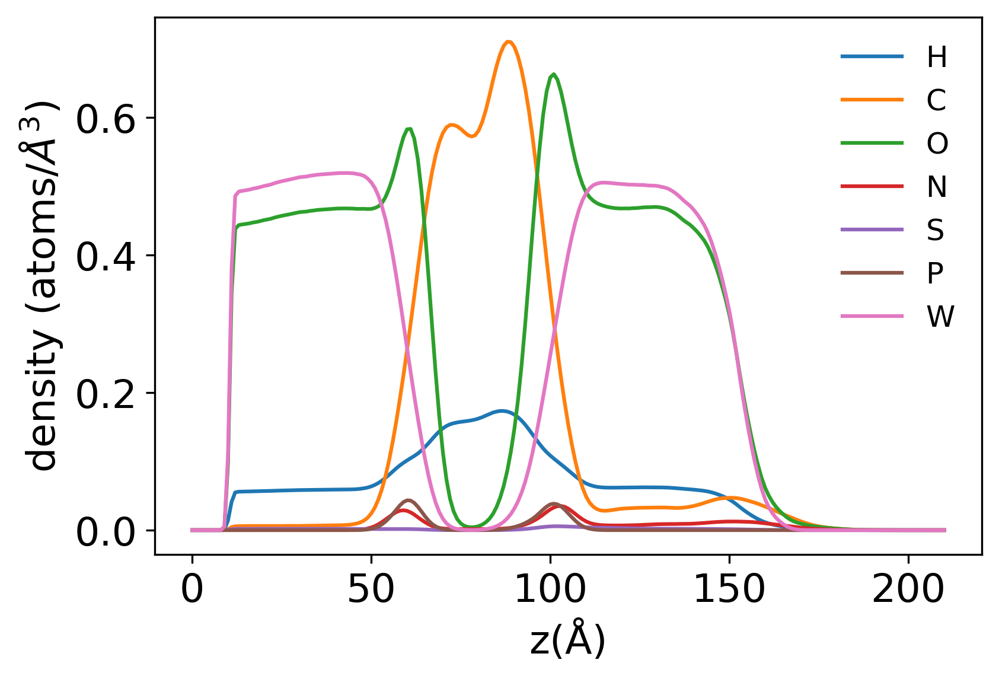

In [101]:
plt.subplot(111)



sum_vecHm = (np.sum(gridHm, axis=(0,1)))/(124*109)
sum_vecCm = (np.sum(gridCm, axis=(0,1)))/(124*109)
sum_vecOm = (np.sum(gridOm, axis=(0,1)))/(124*109)
sum_vecNm = (np.sum(gridNm, axis=(0,1)))/(124*109)
sum_vecSm = (np.sum(gridSm, axis=(0,1)))/(124*109)
sum_vecPm = (np.sum(gridPm, axis=(0,1)))/(124*109)
sum_vecWm = (np.sum(gridWm, axis=(0,1)))/(124*109)

plt.plot(sum_vecHm, label='H')
plt.plot(sum_vecCm, label='C')
plt.plot(sum_vecOm, label='O')
plt.plot(sum_vecNm, label='N')
plt.plot(sum_vecSm, label='S')
plt.plot(sum_vecPm, label='P')
plt.plot(sum_vecWm, label='W')

#plt.plot(sum_veclH, label='lipids_H')
#plt.plot(sum_vecpH, label='prot_H')
#plt.plot(sum_veclC,label='lipids_C')
#plt.plot(sum_vecpC, label='prot_C')


#plt.plot(denslH[:,0]+10,denslH[:,1], color='C4', lw=1, zorder=1 , label='lipids_H')
#plt.plot(denswH1[:,0]+10,denswH1[:,1], color='C5', lw=1, zorder=1 , label='water_H')
#plt.plot(denspH[:,0]+10,denspH[:,1], color='C6', lw=1, zorder=1 , label='protein_H')
#plt.plot(denswH1[:,0],denswH[:,1], color='C3', lw=1, zorder=1 , label='wH')
#plt.plot (denswH1)
#plt.plot(sum2)
#plt.title('NC - PCPS avg. ECD dens.(xz)')
#plt.xlim([0, 150])
#plt.ylim([0, 120])

plt.legend(loc='best', frameon = False, fontsize = 12)
plt.xlabel('z(Å)')
plt.ylabel('density (atoms/$Å^{3}$)')
plt.show()

## FVIIa TF-Cl1µs PCPS update (Sept-Oct 2020) -- Prod only

In [3]:
## Box dimensions 

dim_wO = np.genfromtxt ('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dim/dim_wOpbctmd.dat')

x_min_avg  = np.average(dim_wO[:,1]) 
y_min_avg  = np.average(dim_wO[:,2])
z_min_avg = np.average(dim_wO[:,3])
x_max_avg  = np.average(dim_wO[:,4])
y_max_avg  = np.average(dim_wO[:,5])
z_max_avg  = np.average(dim_wO[:,6])

x_dim_avg  = np.average(dim_wO[:,7])
y_dim_avg  = np.average(dim_wO[:,8])
xy_dim_avg  = np.average(dim_wO[:,9])

print (x_min_avg, y_min_avg, z_min_avg, x_max_avg, y_max_avg, z_max_avg,)
print (x_dim_avg,y_dim_avg,xy_dim_avg)


-0.043166074068012796 -0.044649684494536344 -0.04251670319582941 117.90510111535134 102.11628726700253 170.067293895741
117.94826718941935 102.16093695149706 12050.162377226214


In [8]:
#load DX
#H
dens_dx_wH = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_wHpbcmcp.dx')
dens_dx_lH = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_lHpbcmcp.dx')
dens_dx_pH = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_pHpbcmcp.dx')
dens_dx_H  = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_Hpbcmcp.dx')
#C
dens_dx_lC = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_lCpbcmcp.dx')
dens_dx_pC = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_pCpbcmcp.dx')
dens_dx_C  = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_Cpbcmcp.dx')
#O
dens_dx_lO = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_lOpbcmcp.dx')
dens_dx_pO = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_pOpbcmcp.dx')
dens_dx_wO = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_wOpbcmcp.dx')
dens_dx_O  = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_Opbcmcp.dx')
#N
dens_dx_pN = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_pNpbcmcp.dx')
dens_dx_lN = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_lNpbcmcp.dx')
dens_dx_N  = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_Npbcmcp.dx')
#S
dens_dx_S = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_Spbcmcp.dx')

#P
dens_dx_P = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIaTFcl/dens/elements/FVIIaTFcl_pcps1us_prod_200ps_Ppbcmcp.dx')

#wat
#dens_wat_psf = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/dens/elements/CL_1us_pcps_s200ns_200ps_watpsf.dx')

# Resample maps to wH
H_on_wO = dens_dx_H.resample(dens_dx_wO.edges)
O_on_wO = dens_dx_O.resample(dens_dx_wO.edges)
C_on_wO = dens_dx_C.resample(dens_dx_wO.edges)
N_on_wO = dens_dx_N.resample(dens_dx_wO.edges)

lH_on_wO = dens_dx_lH.resample(dens_dx_wO.edges)
pH_on_wO = dens_dx_pH.resample(dens_dx_wO.edges)

lC_on_wO = dens_dx_lC.resample(dens_dx_wO.edges)
pC_on_wO = dens_dx_pC.resample(dens_dx_wO.edges)

lO_on_wO = dens_dx_lO.resample(dens_dx_wO.edges)
pO_on_wO = dens_dx_pO.resample(dens_dx_wO.edges)
wH_on_wO = dens_dx_wH.resample(dens_dx_wO.edges)

lN_on_wO = dens_dx_lN.resample(dens_dx_wO.edges)
pN_on_wO = dens_dx_pN.resample(dens_dx_wO.edges)

S_on_wO = dens_dx_S.resample(dens_dx_wO.edges)

P_on_wO = dens_dx_P.resample(dens_dx_wO.edges)
#wat_on_O  = dens_wat_psf.resample(dens_dx_wO.edges)




In [9]:
# Sum maps

Hs =  wH_on_wO + lH_on_wO + pH_on_wO
Cs = pC_on_wO + lC_on_wO
Os = lO_on_wO + pO_on_wO + dens_dx_wO
Ns = pN_on_wO + lN_on_wO 
S = S_on_wO
P = P_on_wO
#Ws  = wat_on_O

H = H_on_wO 
C = C_on_wO
O = O_on_wO
N = N_on_wO

print (H, C,O,N)

# Convert to arrays -- element

gridHs = Hs.grid
gridCs = Cs.grid
gridOs = Os.grid
gridNs = Ns.grid
#gridWs = Ws.grid

gridH = H.grid
gridC = C.grid
gridO = O.grid
gridN = N.grid
gridS = S.grid
gridP = P.grid

<<class 'gridData.core.Grid'> with (119, 103, 172) bins> <<class 'gridData.core.Grid'> with (119, 103, 172) bins> <<class 'gridData.core.Grid'> with (119, 103, 172) bins> <<class 'gridData.core.Grid'> with (119, 103, 172) bins>


findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


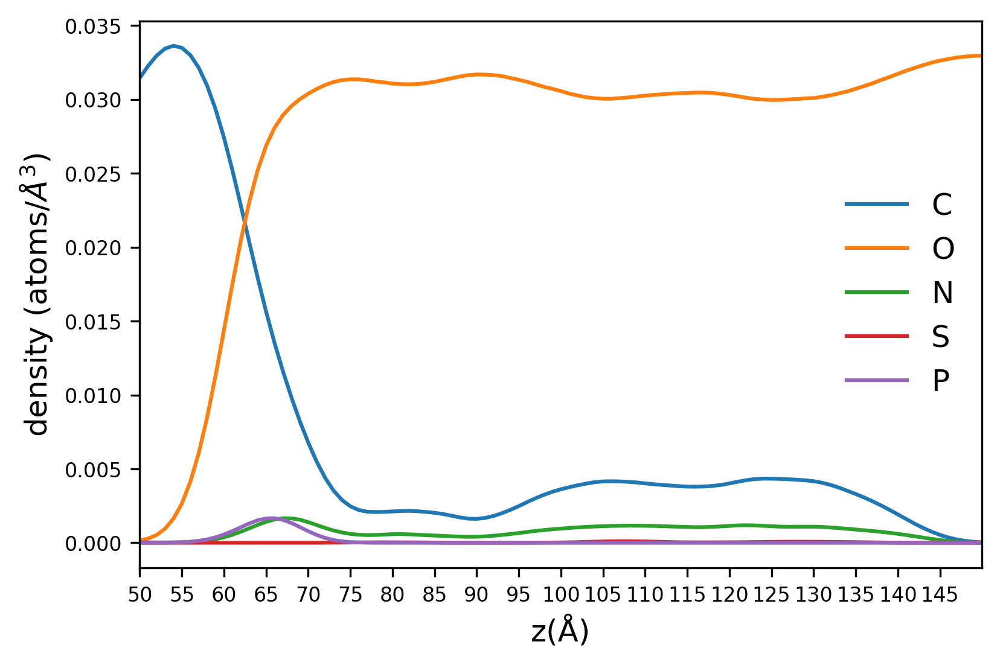

In [16]:
plt.subplot(111)



#sum_vecHs = (np.sum(gridHs, axis=(0,1)))/(116*101)#/(124*109) ;#/(151*134)
#sum_vecCs = (np.sum(gridCs, axis=(0,1)))/(117*101)#/(124*109) ;#/(151*134)
#sum_vecOs = (np.sum(gridOs, axis=(0,1)))/(117*101)#/(124*109) ;#/(151*134)
#sum_vecNs = (np.sum(gridNs, axis=(0,1)))/(117*101)#/(124*109) ;#/(151*134)
#sum_vecWs = (np.sum(gridWs, axis=(0,1)))/(117*101)#/(124*109) ;#/(151*134)/11820

sum_vecH = (np.sum(gridH, axis=(0,1)))/12050
sum_vecC = (np.sum(gridC, axis=(0,1)))/12050
sum_vecO = (np.sum(gridO, axis=(0,1)))/12050
sum_vecN = (np.sum(gridN, axis=(0,1)))/12050
sum_vecS = (np.sum(gridS, axis=(0,1)))/12050
sum_vecP = (np.sum(gridP, axis=(0,1)))/12050

#plt.plot(sum_vecHs, label='Hs')
#plt.plot(sum_vecCs, label='Cs')
#plt.plot(sum_vecOs, label='Os')
#plt.plot(sum_vecNs, label='Ns')

#plt.plot(sum_vecH, label='H')
plt.plot(sum_vecC, label='C')
plt.plot(sum_vecO, label='O')
plt.plot(sum_vecN, label='N')
plt.plot(sum_vecS, label='S')
plt.plot(sum_vecP, label='P')

#print (sum_vecC)
#np.savetxt ('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/CL/dens/elements/CL_1us_pcps_s200ns_200ps_density_elements_try2.dat',np.c_[sum_vecH,sum_vecO,sum_vecC,sum_vecN,sum_vecS,sum_vecP],header= 'Columns: H,O,C,N,S,P')
#plt.plot(sum_vecW, label='W')

#plt.plot(sum_veclH, label='lipids_H')
#plt.plot(sum_vecpH, label='prot_H')
#plt.plot(sum_veclC,label='lipids_C')
#plt.plot(sum_vecpC, label='prot_C')


#plt.plot(denslH[:,0]+10,denslH[:,1], color='C4', lw=1, zorder=1 , label='lipids_H')
#plt.plot(denswH1[:,0]+10,denswH1[:,1], color='C5', lw=1, zorder=1 , label='water_H')
#plt.plot(denspH[:,0]+10,denspH[:,1], color='C6', lw=1, zorder=1 , label='protein_H')
#plt.plot(denswH1[:,0],denswH[:,1], color='C3', lw=1, zorder=1 , label='wH')
#plt.plot (denswH1)
#plt.plot(sum2)
#plt.title('NC - PCPS avg. ECD dens.(xz)')
plt.xlim([50, 150])
#plt.ylim([0, 120])
plt.xticks(np.arange(50, 150, 5))
plt.tick_params(axis='both', which='major', labelsize=8)
plt.legend(loc='best', frameon = False, fontsize = 12)
plt.xlabel('z(Å)')
plt.ylabel('density (atoms/$Å^{3}$)')
plt.show()

### Angle, PLC, Density and RMSD/RMSF analysis of new FVIIa+glyc + TF complex in PCPS membrane (Oct. 2020)

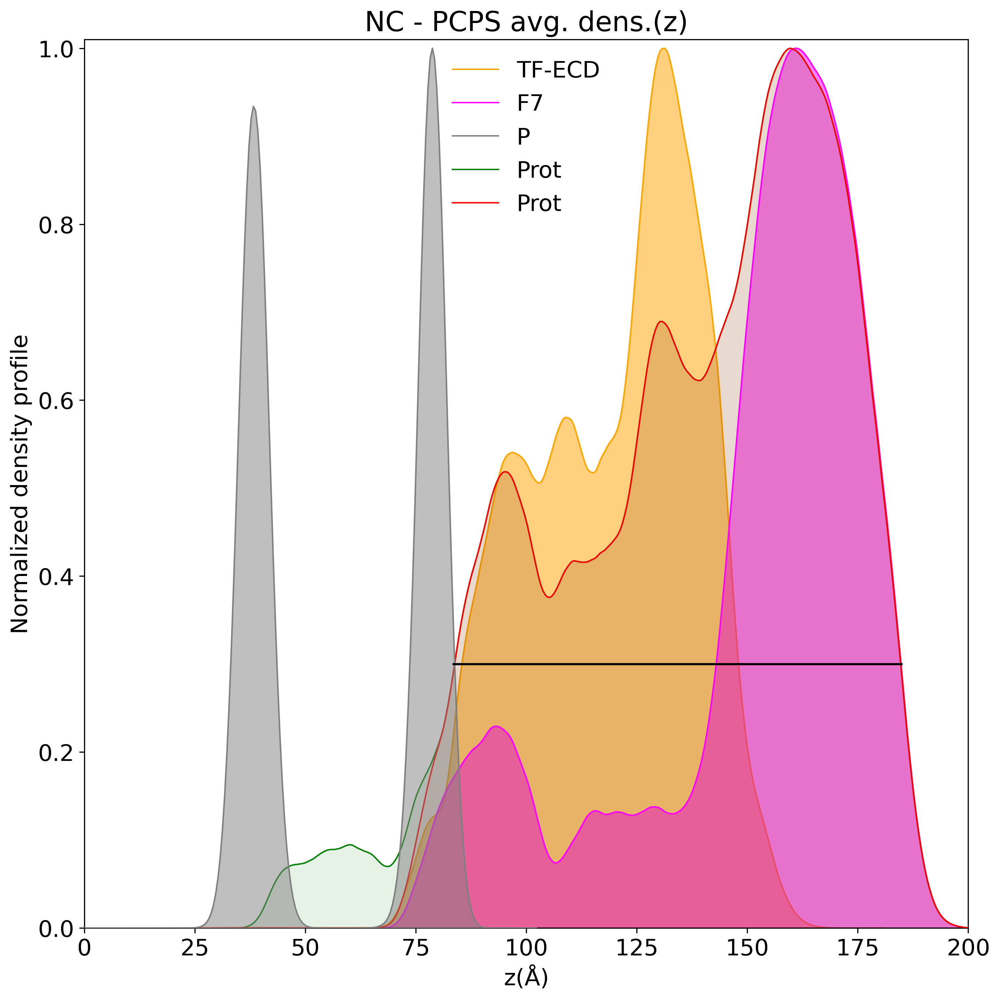

In [42]:
## Density ##

### Density profiles z_collapsed with volutil (due to issues getting the right dims)

## Load density maps ##

## Protein density ## 






ECDdens   =np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_ECDdens.dx_z.dat')
F7dens    =np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_F7dens.dx_z.dat')
F7glycdens=np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_F7glycdens.dx_z.dat')
HGPCdens  =np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_HGPCdens.dx_z.dat')
HGPSdens  =np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_HGPSdens.dx_z.dat')
HGdens    =np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_HGdens.dx_z.dat')
PROTdens  =np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_PROTdens.dx_z.dat')
PROT_no_TMD_dens  =np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_PROT_no_TMD_dens.dx_z.dat')
Pdens     =np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_Pdens.dx_z.dat')
TMDdens   =np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_s200ns_200ps_TMDdens.dx_z.dat')

def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

#ECD
N_ECD = NormalizeData(ECDdens[:,1])
N_TMD = NormalizeData(TMDdens[:,1])
N_F7  = NormalizeData(F7dens[:,1])
N_P   = NormalizeData(Pdens[:,1])
N_prot = NormalizeData(PROTdens[:,1]) 
N_pntmd= NormalizeData(PROT_no_TMD_dens[:,1]) 

plt.figure( figsize = (10,10) )

plt.subplot(111)

plt.plot((ECDdens[:,0]*(-1)+150),N_ECD, color='orange', lw=1, zorder=1, label = 'TF-ECD')
plt.fill_between((ECDdens[:,0]*(-1)+150),N_ECD, color='orange', alpha=0.5, zorder=1)

#plt.plot((TMDdens[:,0]*(-1)+150),N_TMD, color='orange', lw=1, zorder=1)
#plt.fill_between((TMDdens[:,0]*(-1)+150),N_TMD, color='orange', alpha=0.5, zorder=1)

#plt.plot(TMDdens[:,0],TMDdens[:,1], color='orange', lw=1, zorder=2, label = 'ECD')
#plt.fill_between(TMDdens[:,0],TMDdens[:,1], color='orange', alpha=0.5, zorder=2)

plt.plot((F7dens[:,0]*(-1)+150),N_F7, color='magenta', lw=1, zorder=2, label = 'F7')
plt.fill_between((F7dens[:,0]*(-1)+150),N_F7, color='magenta', alpha=0.5, zorder=2)

plt.plot(Pdens[:,0]*(-1)+150,N_P, color='grey', lw=1, zorder=5, label = 'P')
plt.fill_between(Pdens[:,0]*(-1)+150,N_P, color='grey', alpha=0.5, zorder=5)

plt.plot(PROTdens[:,0]*(-1)+150,N_prot, color='green', lw=1, zorder=3, label = 'Prot')
plt.fill_between(PROTdens[:,0]*(-1)+150,N_prot, color='green', alpha=0.1, zorder=2)

plt.plot(PROT_no_TMD_dens[:,0]*(-1)+150,N_pntmd, color='red', lw=1, zorder=3, label = 'Prot')
plt.fill_between(PROT_no_TMD_dens[:,0]*(-1)+150,N_pntmd, color='red', alpha=0.1, zorder=2)

dts1 = np.column_stack((PROT_no_TMD_dens[:,0]*(-1)+150,PROT_no_TMD_dens[:,1]))
dts2 = np.column_stack((TMDdens[:,0]*(-1)+150,TMDdens[:,1]))

q = np.flipud(dts1)
p = np.flipud(dts2)

#np.savetxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_PnoTMD_dens_z.dat', dts1)
#np.savetxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_TMD_dens_z.dat', dts2)

#np.savetxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_PnoTMD_dens_z.dat', p)
#np.savetxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_TMD_dens_z.dat', q)




#np.savetxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/dens/FVIIaTFcl_pcps_PnoTMD_dens_z.dat', np.c_[PROT_no_TMD_dens[:,0]*(-1)+150,PROT_no_TMD_dens[:,1]], delimiter = ' ')



plt.hlines(0.3, 83.3, 185.15, colors='k', linestyles='solid',zorder=6)

plt.title('NC - PCPS avg. dens.(z)')
plt.xlabel('z(Å)')
plt.ylabel('Normalized density profile')
plt.ylim([0,1.01])
plt.xlim([0,200])
plt.legend(loc='best', frameon = False)

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/FVIIac_TFcl1us_density_Oct2020.pdf", dpi=300)
plt.show()



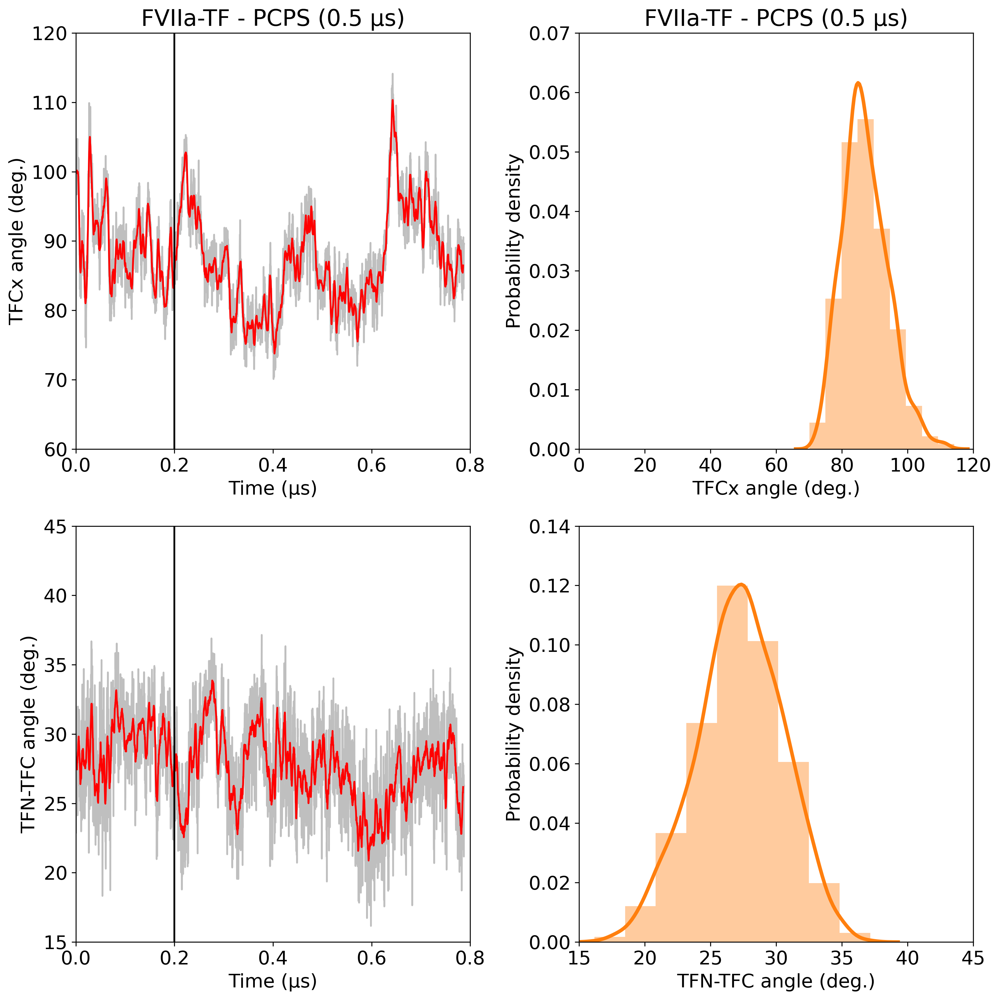

In [27]:
## Angle ##

#TFC-X angle
file5x = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/angle/TFfviia_PCna_TFCangle_s71_6_200ps.dat'
filedx = np.genfromtxt(file5x, usecols=(0,4))


## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

## Eq
file5_eqx = np.genfromtxt(file5x, usecols=(0,4), skip_header=399)



# TFC-TFN angle

NCang = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/angle/TFfviia_PCna_TFN_TFC_angle_s71_6_500ps.dat'

NCang_proc = np.genfromtxt(NCang, usecols=(0,1))

## Eq
NCang_eq = np.genfromtxt(NCang, usecols=(0,1), skip_header=999)

## Fig ##

plt.figure( figsize = (12,12)) 

#CLpcps
df3x=filedx
ma3x=np.mean(rolling_window(df3x, 20), 1)
plt.subplot(221)
plt.plot((df3x[:,0]*0.0002),(df3x[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ma3x[:,0]*0.0002),(ma3x[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 0.8])
plt.ylim([60, 120])
plt.ylabel('TFCx angle (deg.)')
plt.title('FVIIa-TF - PCPS (0.5 µs)')
plt.vlines(0.2, 60, 120, colors='k', linestyles='solid',zorder=6)

df4_eqx=file5_eqx
plt.subplot(222)
sns.distplot((df4_eqx[:,1]*57.2958), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFCx angle (deg.)')
plt.ylabel('Probability density')
plt.title('FVIIa-TF - PCPS (0.5 µs)')
plt.xlim([0, 120])
plt.ylim([0, 0.07])

df10=NCang_proc
ma10=np.mean(rolling_window(df10, 20), 1)
plt.subplot(223)
plt.plot((df10[:,0]*0.0002),df10[:,1]*57.2958, color='gray', alpha=0.5)
plt.plot((ma10[:,0]*0.0002),ma10[:,1]*57.2958, color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 0.8])
plt.ylim([15, 45])
plt.ylabel('TFN-TFC angle (deg.)')
#plt.title('CL - PCPS (1 µs)')
plt.vlines(0.2, 15, 45, colors='k', linestyles='solid',zorder=6)

df10_eq=NCang_eq 
plt.subplot(224)
sns.distplot(df10_eq[:,1]*57.2958, bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('TFN-TFC angle (deg.)')
plt.ylabel('Probability density')
#plt.title('CL - PCPS (1 µs)')
plt.xlim([15, 45])
plt.ylim([0, 0.14])

plt.tight_layout()  
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/FVIIac_TFcl1us_angles_Nov2020.pdf", dpi=300)
plt.show()



86.48964246362523 1.6931864425531025


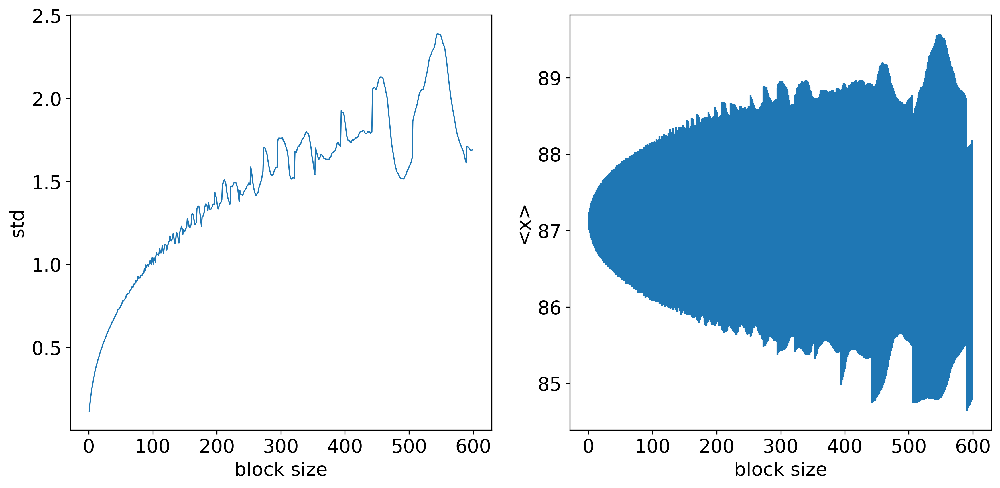

27.12608624630451 0.8935074608191274


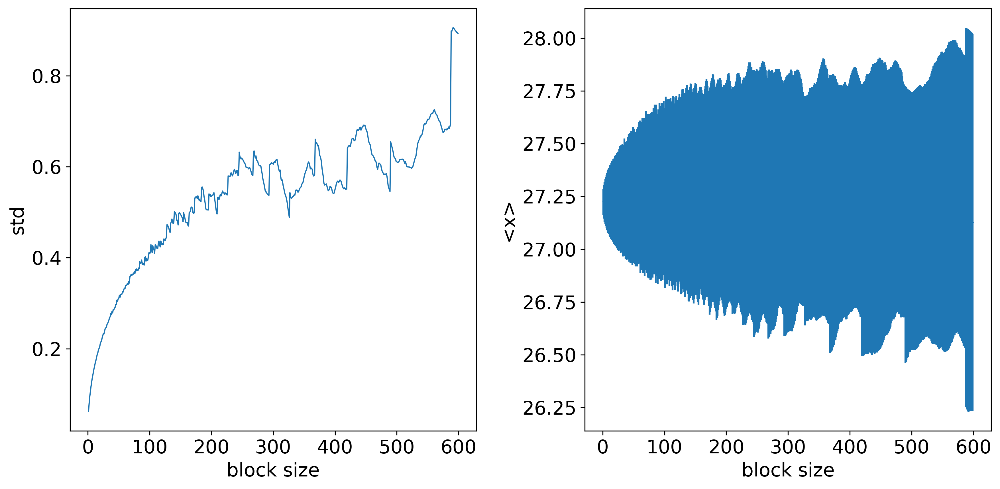

In [25]:
blockAverage(file5_eqx[:,1]*57.2958,maxBlockSize=600)
blockAverage(NCang_eq[:,1]*57.2958,maxBlockSize=600)

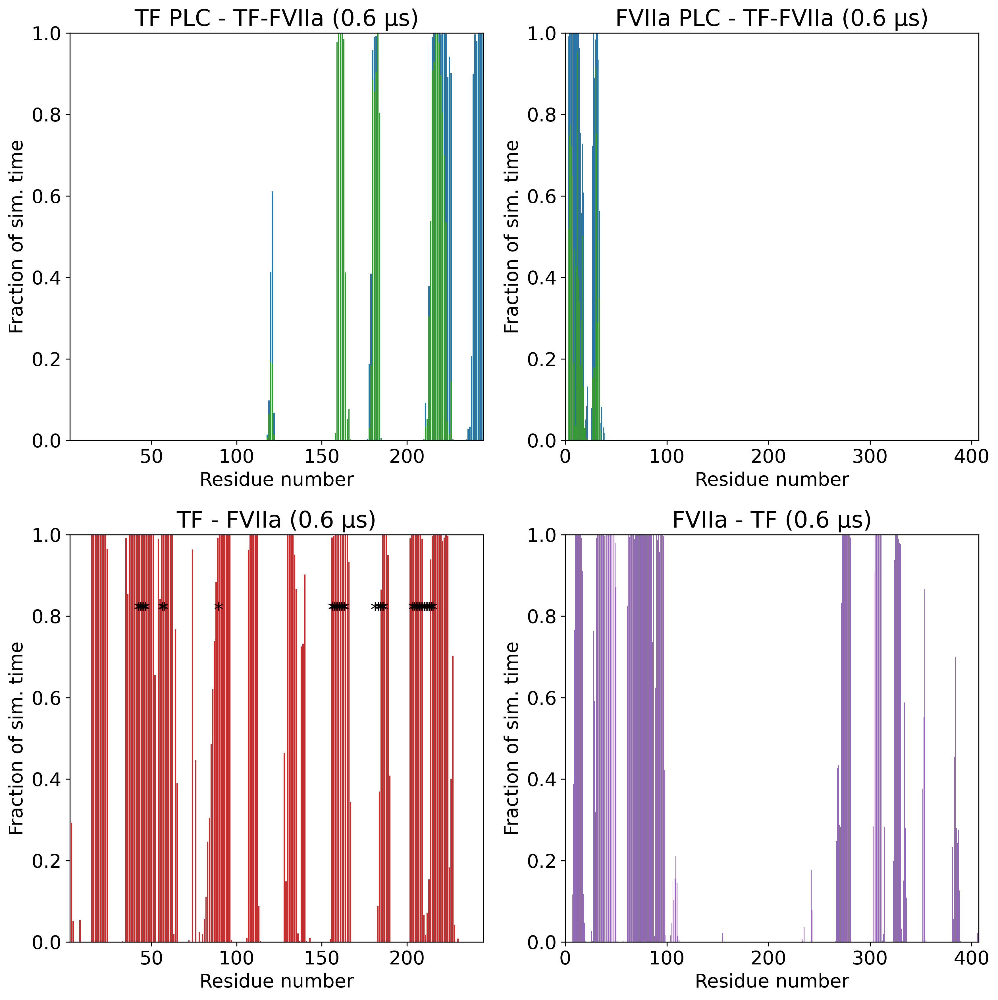

In [12]:
## PLC ##

## TF - FVIIa

  

## Fig ##
plt.figure( figsize = (12,12)) 

file11 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/PLC/pcps_F7PLC_PC_100ps_s71_6.dat_hist.dat'
file12 = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/PLC/pcps_F7PLC_PS_100ps_s71_6.dat_hist.dat'

file9 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/PLC/pcps_TFPLC_PC_100ps_s71_6.dat_hist.dat'
file10 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/PLC/pcps_TFPLC_PS_100ps_s71_6.dat_hist.dat'


file14 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/PLC/pcps_F7_TF_PP_100ps_s71_6.dat_hist.dat'
file13 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/PLC/pcps_TF_F7_PP_100ps_s71_6.dat_hist.dat'
#AS dist
#file_AS =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/PLC/pcps_F7_ASdist_100ps_prod.dat_hist.dat'

## TF - TFcl-FVIIa 

with open(file9, 'r') as fd:
    lines9 = fd.read().split()    
    counter9 = Counter(lines9)
    items9 = sorted(counter9.items(), key=lambda x: int(x[0]))
    num_items9 = np.array(items9, dtype=int)    
    #print(len(lines9))
    
with open(file10, 'r') as fd:
    lines10 = fd.read().split()   
    counter10 = Counter(lines10)
    items10 = sorted(counter10.items(), key=lambda x: int(x[0]))
    num_items10 = np.array(items10, dtype=int)    
    #print(num_items10)
    
    plt.subplot(221)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('TF PLC - TF-FVIIa (0.6 µs)')
    #plt.bar((num_items5[:,0]+34), (num_items5[:,1]/7268), color= 'gray', zorder=1)
    plt.bar((num_items9[:,0]+2), (num_items9[:,1]/5875), color='C0', zorder=1)
    plt.bar((num_items10[:,0]+2), (num_items10[:,1]/5875), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])        
    
# FVIIa - TFcl-FVIIa
with open(file11, 'r') as fd:
    lines11 = fd.read().split()    
    counter11 = Counter(lines11)
    items11 = sorted(counter11.items(), key=lambda x: int(x[0]))
    num_items11 = np.array(items11, dtype=int)    
    #print(len(lines9))
    
with open(file12, 'r') as fd:
    lines12 = fd.read().split()    
    counter12 = Counter(lines12)
    items12 = sorted(counter12.items(), key=lambda x: int(x[0]))
    num_items12 = np.array(items12, dtype=int)    
    #print(num_items10)
    
    plt.subplot(222)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('FVIIa PLC - TF-FVIIa (0.6 µs)')
    #plt.bar((num_items5[:,0]+34), (num_items5[:,1]/7268), color= 'gray', zorder=1)
    plt.bar((num_items11[:,0]+2), (num_items11[:,1]/5875), color='C0', zorder=1)
    plt.bar((num_items12[:,0]+2), (num_items12[:,1]/5875), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([0, 407])         

    
    
## P-P contacts

## TF - FVIIa

with open(file13, 'r') as fd:
    lines13 = fd.read().split()    
    counter13 = Counter(lines13)
    items13 = sorted(counter13.items(), key=lambda x: int(x[0]))
    num_items13 = np.array(items13, dtype=int)
    
    plt.subplot(223)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('TF - FVIIa (0.6 µs)')
    plt.bar((num_items13[:,0]+2), (num_items13[:,1]/5875), color='C3', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])    
    
    plt.annotate('*', xy=(41-1.5,0.8))
    plt.annotate('*', xy=(42-1.5,0.8))
    plt.annotate('*', xy=(43-1.5,0.8))
    plt.annotate('*', xy=(44-1.5,0.8))
    plt.annotate('*', xy=(45-1.5,0.8))
    plt.annotate('*', xy=(55-1.5,0.8))
    plt.annotate('*', xy=(56-1.5,0.8))
    plt.annotate('*', xy=(88-1.5,0.8))
    plt.annotate('*', xy=(155-1.5,0.8))
    plt.annotate('*', xy=(156-1.5,0.8))
    plt.annotate('*', xy=(157-1.5,0.8))
    plt.annotate('*', xy=(158-1.5,0.8))
    plt.annotate('*', xy=(159-1.5,0.8))
    plt.annotate('*', xy=(160-1.5,0.8))
    plt.annotate('*', xy=(161-1.5,0.8))
    plt.annotate('*', xy=(162-1.5,0.8))
    plt.annotate('*', xy=(180-1.5,0.8))
    plt.annotate('*', xy=(182-1.5,0.8))
    plt.annotate('*', xy=(183-1.5,0.8))
    plt.annotate('*', xy=(184-1.5,0.8))
    plt.annotate('*', xy=(185-1.5,0.8))
    plt.annotate('*', xy=(202-1.5,0.8))
    plt.annotate('*', xy=(203-1.5,0.8))
    plt.annotate('*', xy=(204-1.5,0.8))
    plt.annotate('*', xy=(205-1.5,0.8))
    plt.annotate('*', xy=(206-1.5,0.8))
    plt.annotate('*', xy=(207-1.5,0.8))
    plt.annotate('*', xy=(208-1.5,0.8))
    plt.annotate('*', xy=(209-1.5,0.8))
    plt.annotate('*', xy=(210-1.5,0.8))
    plt.annotate('*', xy=(211-1.5,0.8))
    plt.annotate('*', xy=(212-1.5,0.8))
    plt.annotate('*', xy=(213-1.5,0.8))
    plt.annotate('*', xy=(214-1.5,0.8))

## FVIIa - TF

with open(file14, 'r') as fd:
    lines14 = fd.read().split()    
    counter14 = Counter(lines14)
    items14 = sorted(counter14.items(), key=lambda x: int(x[0]))
    num_items14 = np.array(items14, dtype=int)
    
    plt.subplot(224)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('FVIIa - TF (0.6 µs)')
    plt.bar((num_items14[:,0]+2), (num_items14[:,1]/5875), color='C4', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([0, 407])     
    
plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/PLC_FVIIac_TFcl1us_PCPS_wof200ns_Aug2020.pdf", dpi=300)
plt.show()     


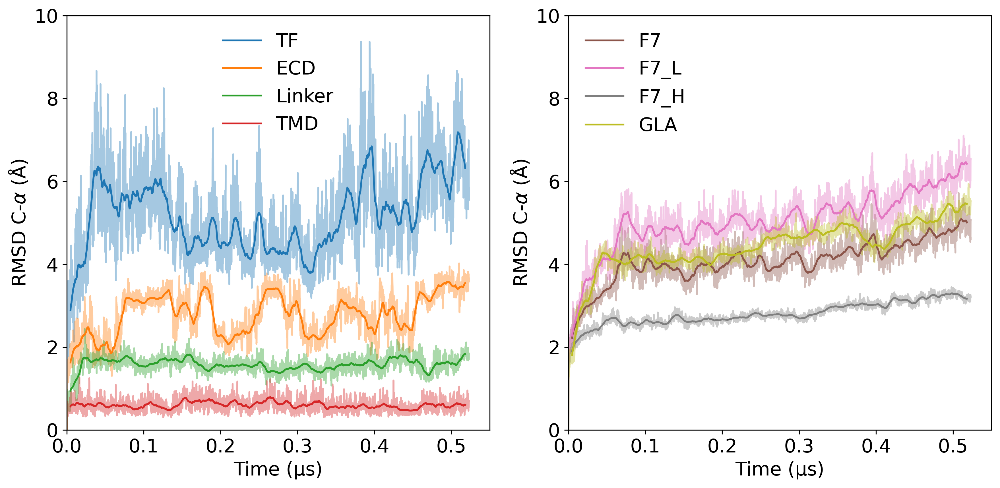

In [60]:
## RMSD ##


## Column def. #

# Col 0 --> frame
# Col 1 --> RMSD all prot aligned
# Col 2 --> ECD_alprot 
# Col 3 --> tfn_alprot
# Col 4 --> tfc_alprot
# Col 5 --> linker_alprot
# Col 6 --> tmd_altmd
# Col 7 --> prot_alTMD
# Col 8 --> ecd_alTMD
# Col 9 --> ECD_alECD
# Col 10--> TFN_alTFN 
# Col 11--> TFC_alTFN 
# Col 12--> TFC_alTFC 
# Col 13--> TFN_alTFC 
# Col 14--> linker_allinker
# Col 15--> F7_alF7 
# Col 16--> F7L_alF7L 
# Col 17--> F7H_alF7H 
# Col 18--> GLA_alGLA


F7_TF_rmsd= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/RMS/FVIIac_TFCLinit_RMSD.dat'

RMSD_F7TF = np.genfromtxt(F7_TF_rmsd, usecols=(0,1,9,14,6,7,15,16,17,18))

plt.figure( figsize = (12,6)) 

rm1=RMSD_F7TF
ma_rm1=np.mean(rolling_window(rm1, 100), 1)
plt.subplot(121)
plt.plot((rm1[:,0]*0.0001),rm1[:,1], color='C0', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,2], color='C1', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,3], color='C2', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,4], color='C3', alpha=0.4)
#plt.plot((rm1[:,0]*0.0001),rm1[:,5], color='C4', alpha=0.4)

plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,1], color='C0', label='TF')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,2], color='C1', label='ECD')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,3], color='C2', label='Linker')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,4], color='C3', label='TMD')
#plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,5], color='C4', label='ECD_alTMD')

plt.xlim([0, 0.55])
plt.ylim([0, 10])
plt.xlabel('Time (µs)')
plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
plt.legend(loc='best', frameon = False)

plt.subplot(122)
plt.plot((rm1[:,0]*0.0001),rm1[:,6], color='C5', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,7], color='C6', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,8], color='C7', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,9], color='C8', alpha=0.4)

plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,6], color='C5', label='F7')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,7], color='C6', label='F7_L')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,8], color='C7', label='F7_H')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,9], color='C8', label='GLA')

plt.xlim([0, 0.55])
plt.ylim([0, 10])
plt.xlabel('Time (µs)')
plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
plt.legend(loc='best', frameon = False)

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/FVIIac_TFcl1us_angles_Oct2020.pdf", dpi=300)
plt.show()



Text(0, 0.5, 'RMSF C-$\\alpha$ (Å)')

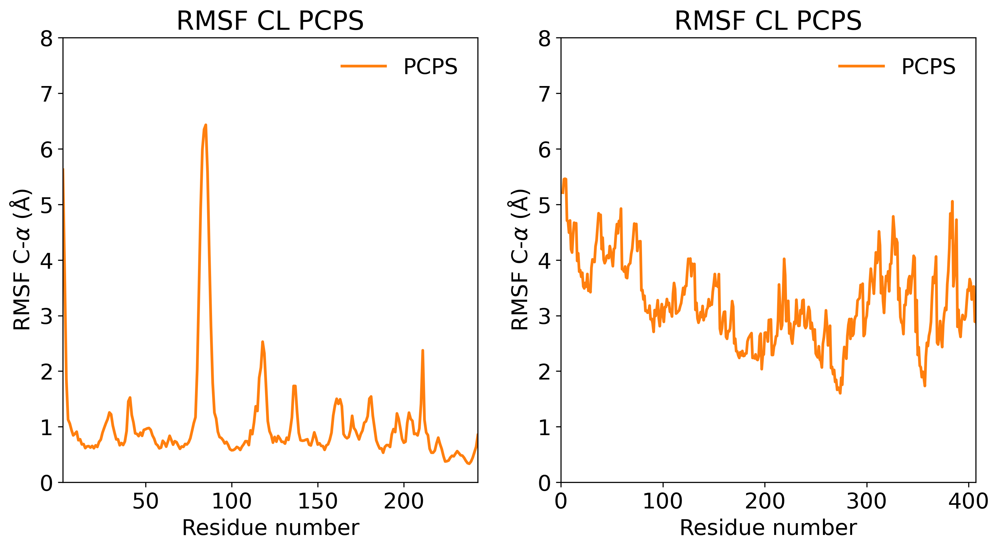

In [7]:
## RMSF ## 


ECD= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/RMS/FVIIac_TFCLinit_100ps_ECD_RMSF.dat'
F7= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/RMS/FVIIac_TFCLinit_100ps_F7_RMSF.dat'
#/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/RMS/FVIIac_TFCLinit_100ps_RMSF.dat'
TMD='/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/RMS/FVIIac_TFCLinit_100ps_TMD_RMSF.dat'
linker= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/RMS/FVIIac_TFCLinit_100ps_linker_RMSF.dat'

ecd_RMSF=(np.genfromtxt(ECD))
lnk_RMSF=(np.genfromtxt(linker))
tmd_RMSF=(np.genfromtxt(TMD)) 
f7_RMSF=(np.genfromtxt(F7))
#
RMSF= np.concatenate((ecd_RMSF,lnk_RMSF,tmd_RMSF))

plt.figure( figsize = (12,6)) 

#RMSF
plt.subplot(121)
y = RMSF; x = arange(y.size)+2; 
plt.plot(x,RMSF, color='C1', label='PCPS', lw=2)

plt.xlim([2, 243])
plt.ylim([0, 8])
#plt.yticks(np.arange(0, 10, 2))
#plt.ticklabel_format(axis='y',useOffset=1)
plt.legend(loc='best', frameon = False)
plt.title('RMSF CL PCPS')
plt.xlabel('Residue number')
plt.ylabel('RMSF C-' r'$\alpha$' ' (Å)')

plt.subplot(122)
y2 = f7_RMSF; x2 = arange(y2.size)+2; 
plt.plot(x2,f7_RMSF, color='C1', label='PCPS', lw=2)

plt.xlim([0, 407])
plt.ylim([0, 8])
#plt.yticks(np.arange(0, 10, 2))
#plt.ticklabel_format(axis='y',useOffset=1)
plt.legend(loc='best', frameon = False)
plt.title('RMSF CL PCPS')
plt.xlabel('Residue number')
plt.ylabel('RMSF C-' r'$\alpha$' ' (Å)')



(60.0, 120.0)

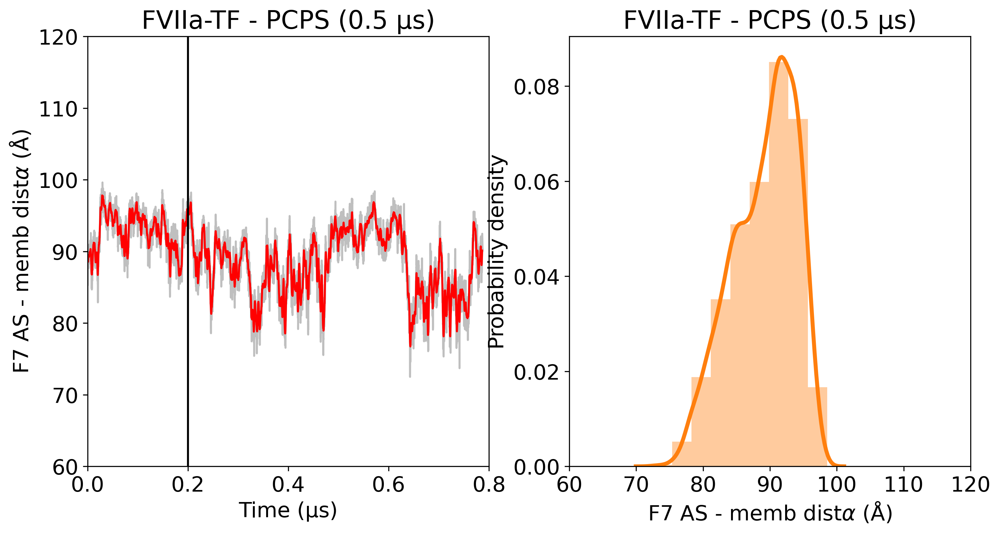

In [65]:
## F7 AS dist ##

file_AS =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/PLC/pcps_F7_ASdist_100ps_s71_6.dat'

ASdz = np.genfromtxt(file_AS, usecols=(0,4))

## Eq
ASdz_eq = np.genfromtxt(file_AS, usecols=(0,4),skip_header=399)

## Fig ##

plt.figure( figsize = (12,6)) 

#CLpcps
dasz=ASdz
madasz=np.mean(rolling_window(dasz, 20), 1)
plt.subplot(121)
plt.plot((dasz[:,0]*0.0001),(dasz[:,1]), color='gray', alpha=0.5)
plt.plot((madasz[:,0]*0.0001),(madasz[:,1]), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 0.8])
plt.ylim([60, 120])
plt.ylabel('F7 AS - memb dist' r'$\alpha$' ' (Å)')
plt.title('FVIIa-TF - PCPS (0.5 µs)')
plt.vlines(0.2, 60, 120, colors='k', linestyles='solid',zorder=6)

dasz_eq=ASdz_eq
plt.subplot(122)
sns.distplot((dasz_eq[:,1]), bins=9, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='C1')
plt.xlabel('F7 AS - memb dist' r'$\alpha$' ' (Å)')
plt.ylabel('Probability density')
plt.title('FVIIa-TF - PCPS (0.5 µs)')
plt.xlim([60, 120])
#plt.ylim([0, 0.07])






89.27966101019913 1.4139160780060789


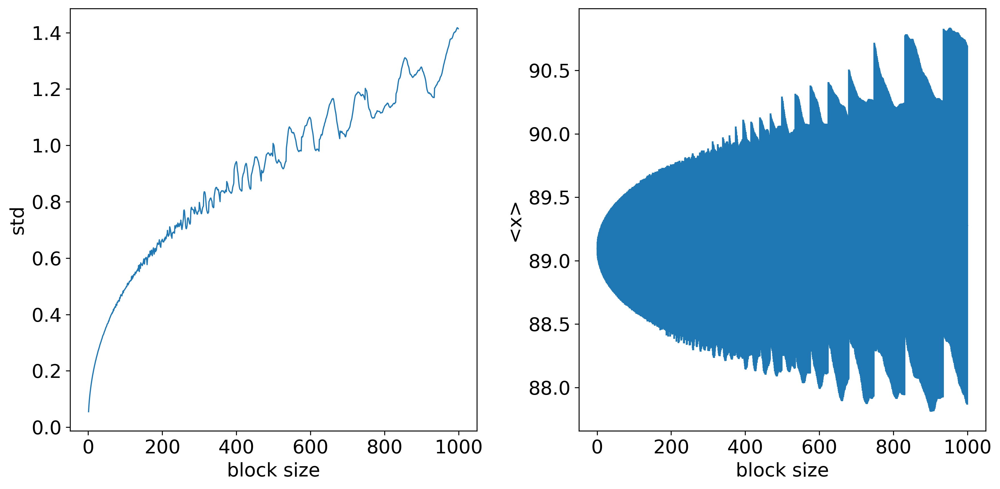

In [73]:
blockAverage(dasz_eq[:,1],maxBlockSize=1000)

# Figures for MS --- Nov. 2020

## PLC & PP contacts --- 1 µs Time evol, prob. dens.

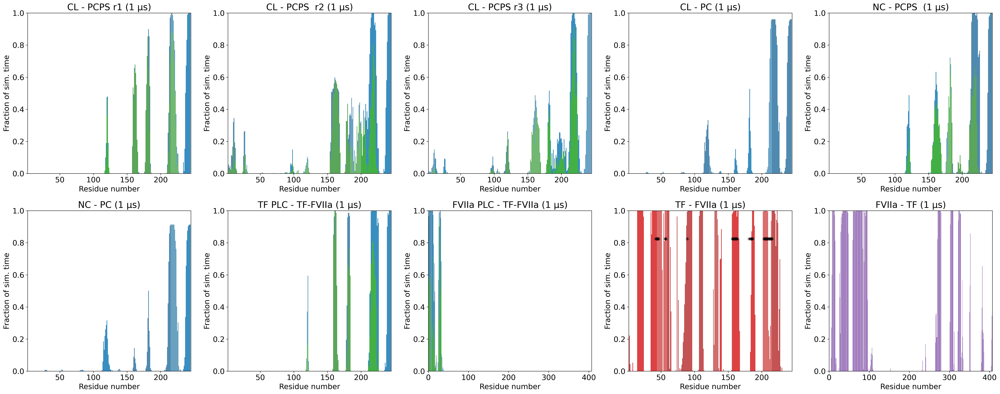

In [12]:
## CL - PCPS
plt.figure( figsize = (30,12)) 
#R1

file1 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/CL_1us_pcps_PLC_PC_100ps.dat_hist.dat.eq'
file2 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/CL_1us_pcps_PLC_PS_100ps.dat_hist.dat.eq'

with open(file1, 'r') as fd:
    lines1 = fd.read().split()
    counter1 = Counter(lines1)
    items1 = sorted(counter1.items(), key=lambda x: int(x[0]))
    num_items1 = np.array(items1, dtype=int)

with open(file2, 'r') as fd:
    lines2 = fd.read().split()
    counter2 = Counter(lines2)
    items2 = sorted(counter2.items(), key=lambda x: int(x[0]))
    num_items2 = np.array(items2, dtype=int)
        
    plt.subplot(251)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('CL - PCPS r1 (1 µs)')
    plt.bar((num_items1[:,0]+2), (num_items1[:,1]/8003), color= 'C0', zorder=1)
    plt.bar((num_items2[:,0]+2), (num_items2[:,1]/8003), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])   
    
#R2

file3 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/CLr2_1us_pcps_PLC_PC_100ps.dat_hist.dat.eq'
file4 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/CLr2_1us_pcps_PLC_PS_100ps.dat_hist.dat.eq'

with open(file3, 'r') as fd:
    lines3 = fd.read().split()
    counter3 = Counter(lines3)
    items3 = sorted(counter3.items(), key=lambda x: int(x[0]))
    num_items3 = np.array(items3, dtype=int)

with open(file4, 'r') as fd:
    lines4 = fd.read().split()
    counter4 = Counter(lines4)
    items4 = sorted(counter4.items(), key=lambda x: int(x[0]))
    num_items4 = np.array(items4, dtype=int)
        
    plt.subplot(252)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('CL - PCPS  r2 (1 µs)')
    plt.bar((num_items3[:,0]+2), (num_items3[:,1]/9421), color= 'C0', zorder=1)
    plt.bar((num_items4[:,0]+2), (num_items4[:,1]/9421), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])   

#R3
file5 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/CLr3_1us_pcps_PLC_PC_100ps.dat_hist.dat.eq'
file6 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/CLr3_1us_pcps_PLC_PS_100ps.dat_hist.dat.eq'

with open(file5, 'r') as fd:
    lines5 = fd.read().split()
    counter5 = Counter(lines5)
    items5 = sorted(counter5.items(), key=lambda x: int(x[0]))
    num_items5 = np.array(items5, dtype=int)

with open(file6, 'r') as fd:
    lines6 = fd.read().split()
    counter6 = Counter(lines6)
    items6 = sorted(counter6.items(), key=lambda x: int(x[0]))
    num_items6 = np.array(items6, dtype=int)
        
    plt.subplot(253)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('CL - PCPS r3 (1 µs)')
    plt.bar((num_items5[:,0]+2), (num_items5[:,1]/9144), color= 'C0', zorder=1)
    plt.bar((num_items6[:,0]+2), (num_items6[:,1]/9144), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])   

    ## CL - PC
file7 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/CL_1us_pc_PLC_PC_100ps.dat_hist.dat.eq'

with open(file7, 'r') as fd:
    lines7 = fd.read().split()
    counter7 = Counter(lines7)
    items7 = sorted(counter7.items(), key=lambda x: int(x[0]))
    num_items7 = np.array(items7, dtype=int)
    #print(num_items3)
    
    plt.subplot(254)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('CL - PC (1 µs)')
    plt.bar((num_items7[:,0]+2), (num_items7[:,1]/8287), color= 'C0', zorder=1)
    plt.ylim([0, 1])
    plt.xlim([2, 245])   

## NC - PCPS
file8 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/NC_1us_pcps_PLC_PC_100ps.dat_hist.dat.eq'
file9 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/NC_1us_pcps_PLC_PS_100ps.dat_hist.dat.eq'

with open(file8, 'r') as fd:
    lines8 = fd.read().split()
    counter8 = Counter(lines8)
    items8 = sorted(counter8.items(), key=lambda x: int(x[0]))
    num_items8 = np.array(items8, dtype=int)

with open(file9, 'r') as fd:
    lines9 = fd.read().split()
    counter9 = Counter(lines9)
    items9 = sorted(counter9.items(), key=lambda x: int(x[0]))
    num_items9 = np.array(items9, dtype=int)
        
    plt.subplot(255)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('NC - PCPS  (1 µs)')
    plt.bar((num_items8[:,0]+2), (num_items8[:,1]/8003), color= 'C0', zorder=1)
    plt.bar((num_items9[:,0]+2), (num_items9[:,1]/8003), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])   

## NC - PC
file10 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/NC_1us_pc_PLC_PC_100ps.dat_hist.dat.eq'

with open(file7, 'r') as fd:
    lines10 = fd.read().split()  
    counter10 = Counter(lines10)
    items10 = sorted(counter10.items(), key=lambda x: int(x[0]))
    num_items10 = np.array(items10, dtype=int)
    #print(num_items3)
    
    plt.subplot(256)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('NC - PC (1 µs)')
    plt.bar((num_items10[:,0]+2), (num_items10[:,1]/8716), color= 'C0', zorder=1)
    plt.ylim([0, 1])
    plt.xlim([2, 245])   

## TF- FVIIa PCPS

## TF - TFcl-FVIIa 

filea =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/TFF7pcps_TFPLC_PC_100ps_s7_1us.dat_hist.dat.eq'
fileb = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/TFF7pcps_TFPLC_PS_100ps_s7_1us.dat_hist.dat.eq'

with open(filea, 'r') as fd:
    linesa = fd.read().split()  
    countera = Counter(linesa)
    itemsa = sorted(countera.items(), key=lambda x: int(x[0]))
    num_itemsa = np.array(itemsa, dtype=int)    
    #print(len(lines9))
    
with open(fileb, 'r') as fd:
    linesb = fd.read()[2000:].split() 
    counterb = Counter(linesb)
    itemsb = sorted(counterb.items(), key=lambda x: int(x[0]))
    num_itemsb = np.array(itemsb, dtype=int)    
    #print(num_items10)
    
    plt.subplot(257)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('TF PLC - TF-FVIIa (1 µs)')
    plt.bar((num_itemsa[:,0]+2), (num_itemsa[:,1]/8466), color='C0', zorder=1)
    plt.bar((num_itemsb[:,0]+2), (num_itemsb[:,1]/8466), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])        
    
    
    
# FVIIa - TFcl-FVIIa
file11 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/TFF7pcps_F7PLC_PC_100ps_s7_1us.dat_hist.dat.eq'
file12 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/TFF7pcps_F7PLC_PS_100ps_s7_1us.dat_hist.dat.eq'

with open(file11, 'r') as fd:
    lines11 = fd.read().split() 
    counter11 = Counter(lines11)
    items11 = sorted(counter11.items(), key=lambda x: int(x[0]))
    num_items11 = np.array(items11, dtype=int)    
    #print(len(lines9))
    
with open(file12, 'r') as fd:
    lines12 = fd.read().split()
    counter12 = Counter(lines12)
    items12 = sorted(counter12.items(), key=lambda x: int(x[0]))
    num_items12 = np.array(items12, dtype=int)    
    #print(num_items10)
    
    plt.subplot(258)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('FVIIa PLC - TF-FVIIa (1 µs)')
    plt.bar((num_items11[:,0]), (num_items11[:,1]/8466), color='C0', zorder=1)
    plt.bar((num_items12[:,0]), (num_items12[:,1]/8466), color='C2', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([0, 407])         
  
 ## P-P contacts

## TF - FVIIa

file13 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/TFF7pcps_TF_F7_PP_100ps_s7_1us.dat_hist.dat.eq'
with open(file13, 'r') as fd:
    lines13 = fd.read().split()   
    counter13 = Counter(lines13)
    items13 = sorted(counter13.items(), key=lambda x: int(x[0]))
    num_items13 = np.array(items13, dtype=int)
    
    plt.subplot(259)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('TF - FVIIa (1 µs)')
    plt.bar((num_items13[:,0]+2), (num_items13[:,1]/8466), color='C3', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([2, 245])    
    
    plt.annotate('*', xy=(41-1.5,0.8))
    plt.annotate('*', xy=(42-1.5,0.8))
    plt.annotate('*', xy=(43-1.5,0.8))
    plt.annotate('*', xy=(44-1.5,0.8))
    plt.annotate('*', xy=(45-1.5,0.8))
    plt.annotate('*', xy=(55-1.5,0.8))
    plt.annotate('*', xy=(56-1.5,0.8))
    plt.annotate('*', xy=(88-1.5,0.8))
    plt.annotate('*', xy=(155-1.5,0.8))
    plt.annotate('*', xy=(156-1.5,0.8))
    plt.annotate('*', xy=(157-1.5,0.8))
    plt.annotate('*', xy=(158-1.5,0.8))
    plt.annotate('*', xy=(159-1.5,0.8))
    plt.annotate('*', xy=(160-1.5,0.8))
    plt.annotate('*', xy=(161-1.5,0.8))
    plt.annotate('*', xy=(162-1.5,0.8))
    plt.annotate('*', xy=(180-1.5,0.8))
    plt.annotate('*', xy=(182-1.5,0.8))
    plt.annotate('*', xy=(183-1.5,0.8))
    plt.annotate('*', xy=(184-1.5,0.8))
    plt.annotate('*', xy=(185-1.5,0.8))
    plt.annotate('*', xy=(202-1.5,0.8))
    plt.annotate('*', xy=(203-1.5,0.8))
    plt.annotate('*', xy=(204-1.5,0.8))
    plt.annotate('*', xy=(205-1.5,0.8))
    plt.annotate('*', xy=(206-1.5,0.8))
    plt.annotate('*', xy=(207-1.5,0.8))
    plt.annotate('*', xy=(208-1.5,0.8))
    plt.annotate('*', xy=(209-1.5,0.8))
    plt.annotate('*', xy=(210-1.5,0.8))
    plt.annotate('*', xy=(211-1.5,0.8))
    plt.annotate('*', xy=(212-1.5,0.8))
    plt.annotate('*', xy=(213-1.5,0.8))
    plt.annotate('*', xy=(214-1.5,0.8))

## FVIIa - TF

file14 =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/PLC/TFF7pcps_F7_TF_PP_100ps_s7_1us.dat_hist.dat.eq'

with open(file14, 'r') as fd:
    lines14 = fd.read().split()     
    counter14 = Counter(lines14)
    items14 = sorted(counter14.items(), key=lambda x: int(x[0]))
    num_items14 = np.array(items14, dtype=int)
    
    plt.subplot(2,5,10)
    plt.xlabel('Residue number')
    plt.ylabel('Fraction of sim. time')
    plt.title('FVIIa - TF (1 µs)')
    plt.bar((num_items14[:,0]), (num_items14[:,1]/8466), color='C4', zorder=2)
    plt.ylim([0, 1])
    plt.xlim([0, 407])     

## FVIIa PCPS

## FXa PCPS 

## Fig ##

plt.tight_layout()  
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/plots_jan21/PLC_report_130121.pdf", dpi=300)

plt.show() 


In [26]:
## Prob. for BF and render --- TF_FVIIa

#TFpcps_psrn=(num_itemsb[:,0]+2)
#TFpcps_psplc=(num_itemsb[:,1]/8466)
#TFpcps_psplc=(num_itemsb[:,1])
#TFpcps_ps_table=np.column_stack((TFpcps_psrn,TFpcps_psplc))

#F7pcps_pcrn=(num_items12[:,0]+2)
#F7pcps_psplc=(num_items12[:,1]/8466)
#F7pcps_ps_table=np.column_stack((F7pcps_pcrn,F7pcps_pcplc))

#print (TFpcps_ps_table)

#print (F7pcps_ps_table)

TFpp_rn =(num_items13[:,0]+2)
TFpp_ppc=(num_items13[:,1]/8466)
TFppc_table=np.column_stack((TFpp_rn,TFpp_ppc))

F7pp_rn =(num_items14[:,0]+2)
F7pp_ppc=(num_items14[:,1]/8466)
F7ppc_table=np.column_stack((F7pp_rn,F7pp_ppc))

print (TFppc_table)
print (F7ppc_table)

[[3.00000000e+00 2.21946610e-01]
 [4.00000000e+00 4.42948264e-02]
 [8.00000000e+00 5.25631940e-02]
 [1.40000000e+01 1.18119537e-04]
 [1.50000000e+01 9.98582566e-01]
 [1.60000000e+01 1.00000000e+00]
 [1.70000000e+01 1.00000000e+00]
 [1.80000000e+01 1.00000000e+00]
 [1.90000000e+01 1.00000000e+00]
 [2.00000000e+01 1.00000000e+00]
 [2.10000000e+01 1.00000000e+00]
 [2.20000000e+01 1.00000000e+00]
 [2.30000000e+01 9.99881880e-01]
 [2.40000000e+01 9.63264824e-01]
 [3.30000000e+01 1.18119537e-03]
 [3.50000000e+01 9.90196078e-01]
 [3.60000000e+01 8.51641862e-01]
 [3.70000000e+01 1.00000000e+00]
 [3.80000000e+01 1.00000000e+00]
 [3.90000000e+01 1.00000000e+00]
 [4.00000000e+01 9.99055044e-01]
 [4.10000000e+01 1.00000000e+00]
 [4.20000000e+01 1.00000000e+00]
 [4.30000000e+01 1.00000000e+00]
 [4.40000000e+01 1.00000000e+00]
 [4.50000000e+01 1.00000000e+00]
 [4.60000000e+01 1.00000000e+00]
 [4.70000000e+01 1.00000000e+00]
 [4.80000000e+01 1.00000000e+00]
 [4.90000000e+01 1.00000000e+00]
 [5.000000

## TFC-X angle --- 1 µs Time evol, prob. dens.

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


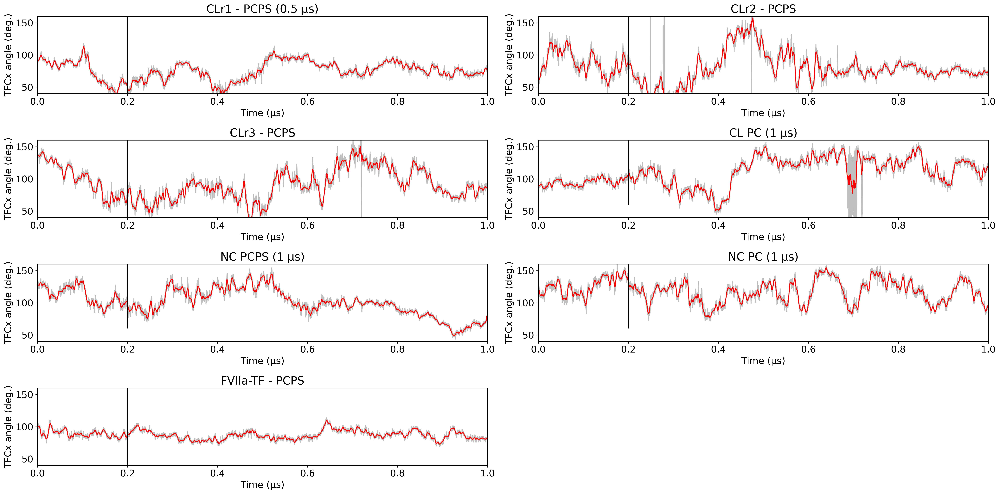

In [3]:
## PCPS ##

### CL ###

CLpsr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/CL_PCPSna_TFCangle_1us_200ps.dat'

CLpsr1a_all = np.genfromtxt(CLpsr1a, usecols=(0,4))
CLpsr1a_eq = np.genfromtxt(CLpsr1a, usecols=(0,4), skip_header=399)

CLpsr2a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/CL_r2_PCPSna_TFCangle_1us_200ps.dat'
CLpsr2a_all = np.genfromtxt(CLpsr2a, usecols=(0,4))
CLpsr2a_eq = np.genfromtxt(CLpsr2a, usecols=(0,4), skip_header=399)

CLpsr3a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/CL_r3_PCPSna_TFCangle_1us_200ps.dat'
CLpsr3a_all = np.genfromtxt(CLpsr3a, usecols=(0,4))
CLpsr3a_eq = np.genfromtxt(CLpsr3a, usecols=(0,4), skip_header=399)

### NC

#PS#
NCpsr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/NC_PCPSna_TFCangle_1us_200ps.dat'
NCpsr1a_all = np.genfromtxt(NCpsr1a, usecols=(0,4))
NCpsr1a_eq = np.genfromtxt(NCpsr1a, usecols=(0,4), skip_header=399)

## PC ##
NCpcr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/NC_PCna_TFCangle_1us_500ps.dat'
NCpcr1a_all = np.genfromtxt(NCpcr1a, usecols=(0,4))
NCpcr1a_eq = np.genfromtxt(NCpcr1a, usecols=(0,4), skip_header=399)


### CL-PC ###

CLpcr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/CL_PCna_TFCangle_1us_200ps.dat'
CLpcr1a_all = np.genfromtxt(CLpcr1a, usecols=(0,4))
CLpcr1a_eq = np.genfromtxt(CLpcr1a, usecols=(0,4), skip_header=399)


# TF-FVIIa

## PCPS ##

TF7psr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/TFfviia_PCna_TFCangle_s7_1us_200ps.dat'
TF7psr1a_all = np.genfromtxt(TF7psr1a, usecols=(0,4))
TF7psr1a_eq = np.genfromtxt(TF7psr1a, usecols=(0,4), skip_header=399)

## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

## Plots
plt.figure( figsize = (24,12)) 

#Rolling averages -- time evol
ravCLpsr1=np.mean(rolling_window(CLpsr1a_all, 20), 1)
ravCLpsr2=np.mean(rolling_window(CLpsr2a_all, 20), 1)
ravCLpsr3=np.mean(rolling_window(CLpsr3a_all, 20), 1)

ravCLpcr1=np.mean(rolling_window(CLpcr1a_all, 20), 1)

ravNCpsr1=np.mean(rolling_window(NCpsr1a_all, 20), 1)
ravNCpcr1=np.mean(rolling_window(NCpcr1a_all, 20), 1)

ravTF7psr1=np.mean(rolling_window(TF7psr1a_all, 20), 1)

#CL_pcps r1-3
plt.subplot(421)
plt.plot((CLpsr1a_all[:,0]*0.0002),(CLpsr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravCLpsr1[:,0]*0.0002),(ravCLpsr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('CLr1 - PCPS (0.5 µs)')
plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

plt.subplot(422)
plt.plot((CLpsr2a_all[:,0]*0.0002),(CLpsr2a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravCLpsr2[:,0]*0.0002),(ravCLpsr2[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('CLr2 - PCPS')
plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

plt.subplot(423)
plt.plot((CLpsr3a_all[:,0]*0.0002),(CLpsr3a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravCLpsr3[:,0]*0.0002),(ravCLpsr3[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('CLr3 - PCPS')
plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

#CLpcr1

plt.subplot(424)
plt.plot((CLpcr1a_all[:,0]*0.0002),(CLpcr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravCLpcr1[:,0]*0.0002),(ravCLpcr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('CL PC (1 µs)')
plt.vlines(0.2, 60, 160, colors='k', linestyles='solid',zorder=6)

#NCpcpsr1

plt.subplot(425)
plt.plot((NCpsr1a_all[:,0]*0.0002),(NCpsr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravNCpsr1[:,0]*0.0002),(ravNCpsr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('NC PCPS (1 µs)')
plt.vlines(0.2, 60, 160, colors='k', linestyles='solid',zorder=6)

#NCpcr1

plt.subplot(426)
plt.plot((NCpcr1a_all[:,0]*0.0002),(NCpcr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravNCpcr1[:,0]*0.0002),(ravNCpcr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('NC PC (1 µs)')
plt.vlines(0.2, 60, 160, colors='k', linestyles='solid',zorder=6)
#
#TF-FVIIapcps

plt.subplot(427)
plt.plot((TF7psr1a_all[:,0]*0.0002),(TF7psr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravTF7psr1[:,0]*0.0002),(ravTF7psr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('FVIIa-TF - PCPS')
plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

plt.tight_layout()  
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/plots_jan21/TFCx_Angle_report130121.pdf", dpi=300)
plt.show()


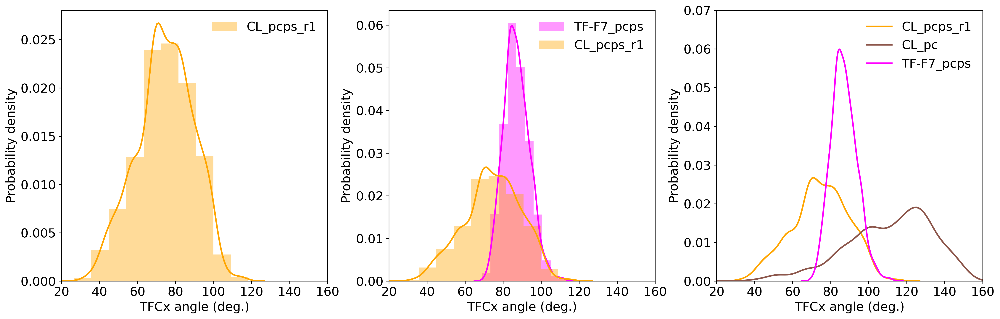

In [10]:
plt.figure( figsize = (18,6)) 
plt.subplot(131)
sns.distplot((CLpsr1a_eq[:,1]*57.2958), bins=10, hist = True, kde = True, kde_kws = {'linewidth': 2}, color='orange', label='CL_pcps_r1')
plt.xlabel('TFCx angle (deg.)')
plt.ylabel('Probability density')
#plt.title('Prob. dens. comp.')
plt.xlim([20, 160])
#plt.ylim([0, 0.07])
plt.legend(loc='best', frameon = False)


plt.subplot(132)
sns.distplot((TF7psr1a_eq[:,1]*57.2958), bins=10, hist = True, kde = True, kde_kws = {'linewidth': 2}, color='magenta', label='TF-F7_pcps')
sns.distplot((CLpsr1a_eq[:,1]*57.2958), bins=10, hist = True, kde = True, kde_kws = {'linewidth': 2}, color='orange', label='CL_pcps_r1')
plt.xlabel('TFCx angle (deg.)')
plt.ylabel('Probability density')
#plt.title('Prob. dens. comp.')
plt.xlim([20, 160])
#plt.ylim([0, 0.07])
plt.legend(loc='best', frameon = False)

plt.subplot(133)
sns.distplot((CLpsr1a_eq[:,1]*57.2958), bins=10, hist = False, kde = True, kde_kws = {'linewidth': 2}, color='orange', label='CL_pcps_r1')
#sns.distplot((CLpsr2a_eq[:,1]*57.2958), bins=10, hist = False, kde = True, kde_kws = {'linewidth': 2}, color='C2', label='CLpcpsr2')
#sns.distplot((CLpsr3a_eq[:,1]*57.2958), bins=10, hist = False, kde = True, kde_kws = {'linewidth': 2}, color='C3', label='CLpcpsr3')
#sns.distplot((NCpsr1a_eq[:,1]*57.2958), bins=9, hist = False, kde = True, kde_kws = {'linewidth': 3}, color='C4',label='NCpcpsr1')
sns.distplot((CLpcr1a_eq[:,1]*57.2958), bins=10, hist = False, kde = True, kde_kws = {'linewidth': 2}, color='C5',label='CL_pc')
#sns.distplot((NCpcr1a_eq[:,1]*57.2958), bins=9, hist = False, kde = True, kde_kws = {'linewidth': 3}, color='C6',label='NCpcr1')
sns.distplot((TF7psr1a_eq[:,1]*57.2958), bins=10, hist = False, kde = True, kde_kws = {'linewidth': 2}, color='magenta', label='TF-F7_pcps')
plt.xlabel('TFCx angle (deg.)')
plt.ylabel('Probability density')
#plt.title('Prob. dens. comp.')
plt.xlim([20, 160])
plt.ylim([0, 0.07])
plt.legend(loc='best', frameon = False)


plt.tight_layout()  
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/plots_jan21/TFCx_Angle_report_prob_dens_130121.pdf", dpi=300)
plt.show()



74.49821809591616 3.752836841083682


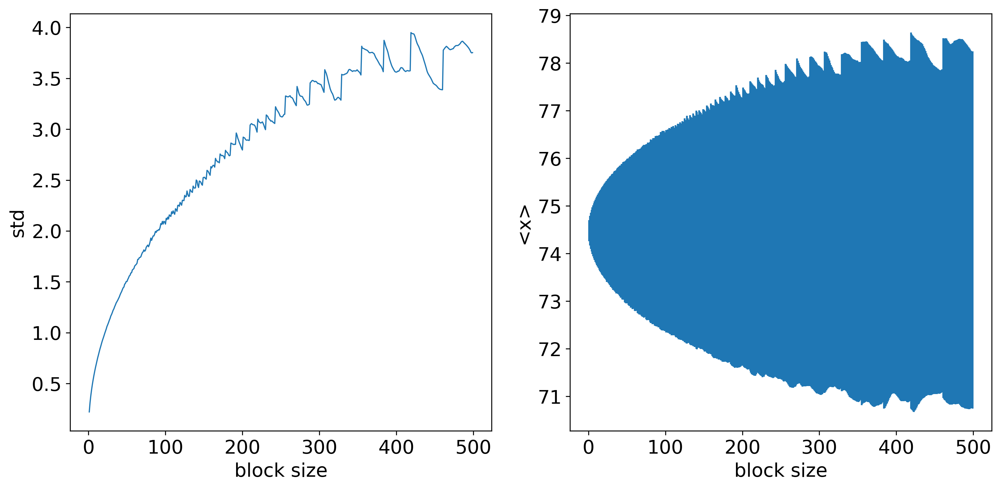

77.67728858197314 5.637880864725249


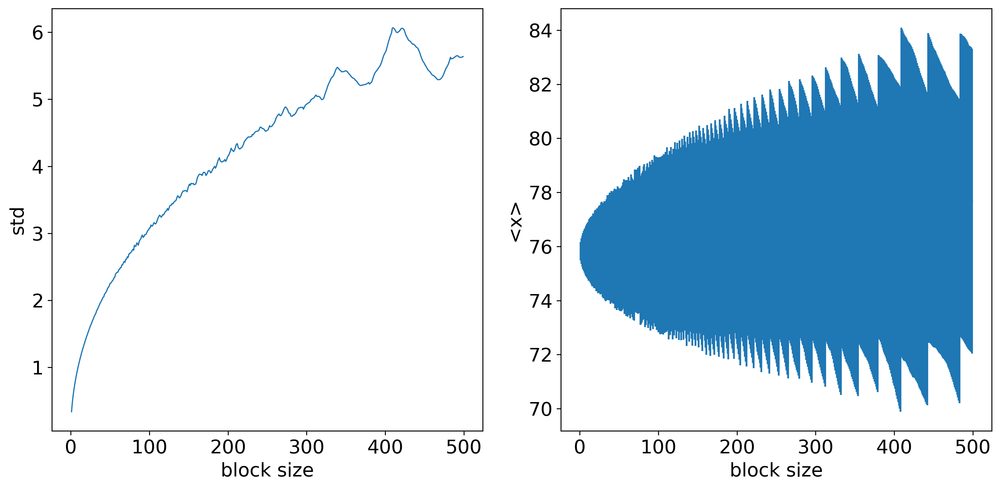

88.00042233781141 5.7231861866368074


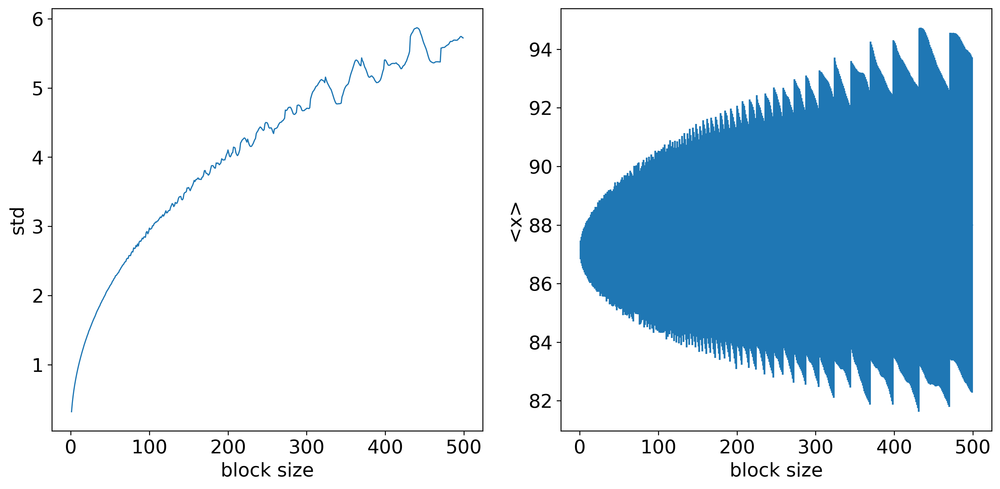

110.97232075479512 6.018738854437604


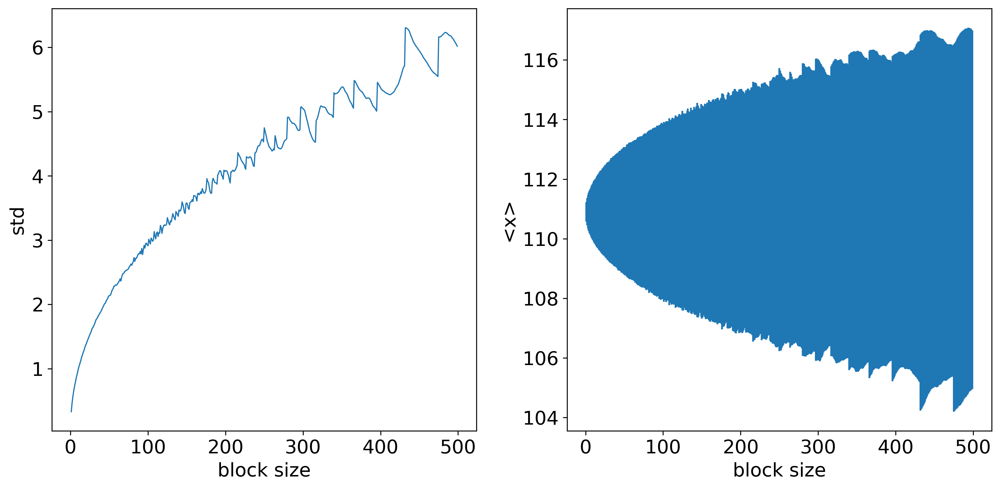

87.12699308189521 1.2774411654519053


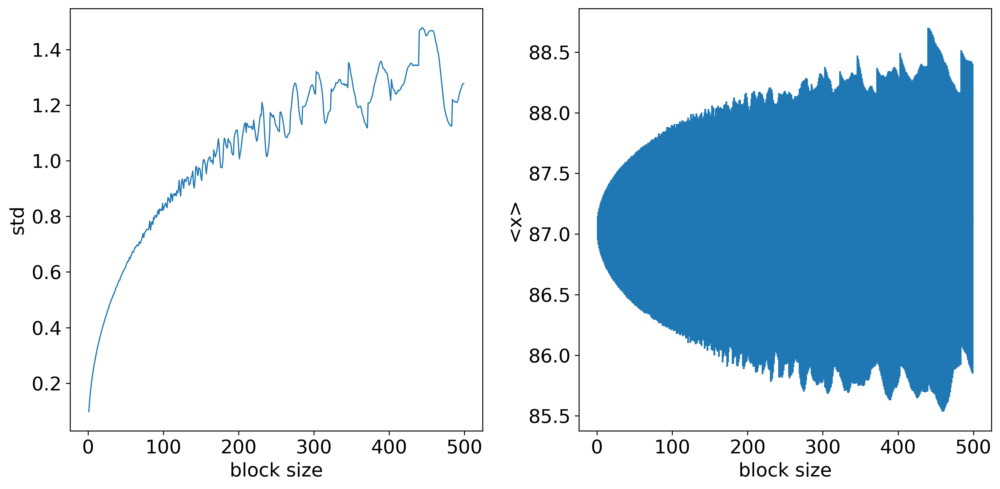

In [18]:
blockAverage(CLpsr1a_eq[:,1]*57.2958,maxBlockSize=500)
blockAverage(CLpsr2a_eq[:,1]*57.2958,maxBlockSize=500)
blockAverage(CLpsr3a_eq[:,1]*57.2958,maxBlockSize=500)
blockAverage(CLpcr1a_eq[:,1]*57.2958,maxBlockSize=500)
blockAverage(TF7psr1a_eq[:,1]*57.2958,maxBlockSize=500)


## TFC-TFN  angle --- 1 µs Time evol, prob. dens.

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


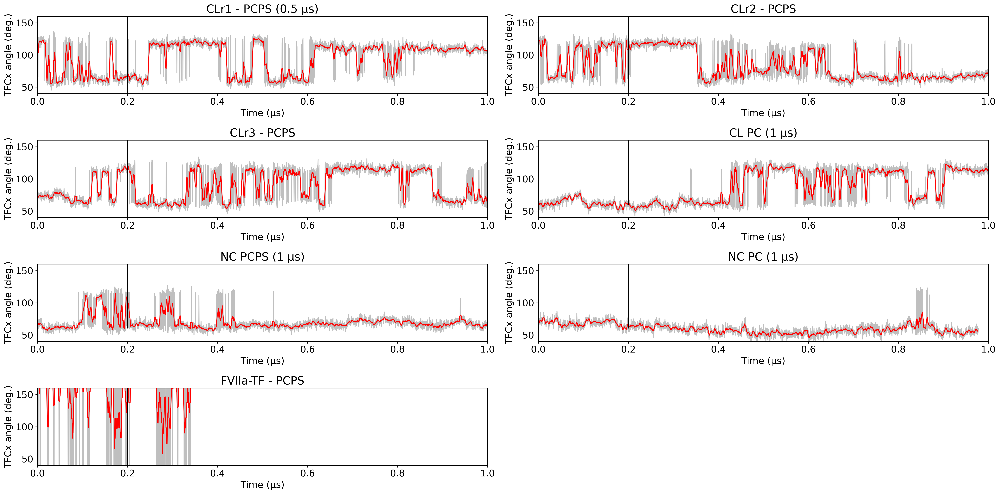

In [3]:

## PCPS ##

### CL ###

CLpsr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/CL_PCPSna_TFN_TFCal_angle_1us_200ps.dat'

CLpsr1a_all = np.genfromtxt(CLpsr1a, usecols=(0,2))
CLpsr1a_eq = np.genfromtxt(CLpsr1a, usecols=(0,2), skip_header=399)

CLpsr2a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/CL_r2_PCPSna_TFN_TFCal_angle_1us_200ps.dat'
CLpsr2a_all = np.genfromtxt(CLpsr2a, usecols=(0,2))
CLpsr2a_eq = np.genfromtxt(CLpsr2a, usecols=(0,2), skip_header=399)

CLpsr3a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/CL_r3_PCPSna_TFN_TFCal_angle_1us_200ps.dat'
CLpsr3a_all = np.genfromtxt(CLpsr3a, usecols=(0,2))
CLpsr3a_eq = np.genfromtxt(CLpsr3a, usecols=(0,2), skip_header=399)

### NC

#PS#
NCpsr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/NC_PCPSna_TFN_TFCal_angle_1us_200ps.dat'
NCpsr1a_all = np.genfromtxt(NCpsr1a, usecols=(0,2))
NCpsr1a_eq = np.genfromtxt(NCpsr1a, usecols=(0,2), skip_header=399)

## PC ##
NCpcr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/NC_PCna_TFN_TFCal_angle_1us_500ps.dat'
NCpcr1a_all = np.genfromtxt(NCpcr1a, usecols=(0,2))
NCpcr1a_eq = np.genfromtxt(NCpcr1a, usecols=(0,2), skip_header=399)


### CL-PC ###

CLpcr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/CL_PCna_TFN_TFCal_angle_1us_200ps.dat'
CLpcr1a_all = np.genfromtxt(CLpcr1a, usecols=(0,2))
CLpcr1a_eq = np.genfromtxt(CLpcr1a, usecols=(0,2), skip_header=399)


# TF-FVIIa

## PCPS ##

TF7psr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/TFfviia_PCna_TFN_TFCal_angle_s7_1us_200ps.dat'
TF7psr1a_all = np.genfromtxt(TF7psr1a, usecols=(0,2))
TF7psr1a_eq = np.genfromtxt(TF7psr1a, usecols=(0,2), skip_header=399)

## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

## Plots
plt.figure( figsize = (24,12)) 

#Rolling averages -- time evol
ravCLpsr1=np.mean(rolling_window(CLpsr1a_all, 20), 1)
ravCLpsr2=np.mean(rolling_window(CLpsr2a_all, 20), 1)
ravCLpsr3=np.mean(rolling_window(CLpsr3a_all, 20), 1)

ravCLpcr1=np.mean(rolling_window(CLpcr1a_all, 20), 1)

ravNCpsr1=np.mean(rolling_window(NCpsr1a_all, 20), 1)
ravNCpcr1=np.mean(rolling_window(NCpcr1a_all, 20), 1)

ravTF7psr1=np.mean(rolling_window(TF7psr1a_all, 20), 1)

#CL_pcps r1-3
plt.subplot(421)
plt.plot((CLpsr1a_all[:,0]*0.0002),(CLpsr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravCLpsr1[:,0]*0.0002),(ravCLpsr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('CLr1 - PCPS (0.5 µs)')
plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

plt.subplot(422)
plt.plot((CLpsr2a_all[:,0]*0.0002),(CLpsr2a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravCLpsr2[:,0]*0.0002),(ravCLpsr2[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('CLr2 - PCPS')
plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

plt.subplot(423)
plt.plot((CLpsr3a_all[:,0]*0.0002),(CLpsr3a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravCLpsr3[:,0]*0.0002),(ravCLpsr3[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('CLr3 - PCPS')
plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

#CLpcr1

plt.subplot(424)
plt.plot((CLpcr1a_all[:,0]*0.0002),(CLpcr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravCLpcr1[:,0]*0.0002),(ravCLpcr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('CL PC (1 µs)')
plt.vlines(0.2, 60, 160, colors='k', linestyles='solid',zorder=6)

#NCpcpsr1

plt.subplot(425)
plt.plot((NCpsr1a_all[:,0]*0.0002),(NCpsr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravNCpsr1[:,0]*0.0002),(ravNCpsr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('NC PCPS (1 µs)')
plt.vlines(0.2, 60, 160, colors='k', linestyles='solid',zorder=6)

#NCpcr1

plt.subplot(426)
plt.plot((NCpcr1a_all[:,0]*0.0002),(NCpcr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravNCpcr1[:,0]*0.0002),(ravNCpcr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('NC PC (1 µs)')
plt.vlines(0.2, 60, 160, colors='k', linestyles='solid',zorder=6)
#
#TF-FVIIapcps

plt.subplot(427)
plt.plot((TF7psr1a_all[:,0]*0.0002),(TF7psr1a_all[:,1]*57.2958), color='gray', alpha=0.5)
plt.plot((ravTF7psr1[:,0]*0.0002),(ravTF7psr1[:,1]*57.2958), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('FVIIa-TF - PCPS')
plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/FVIIac_TFcl1us_angles_Oct2020.pdf", dpi=300)
plt.show()

## TFN-TFC angle tests 

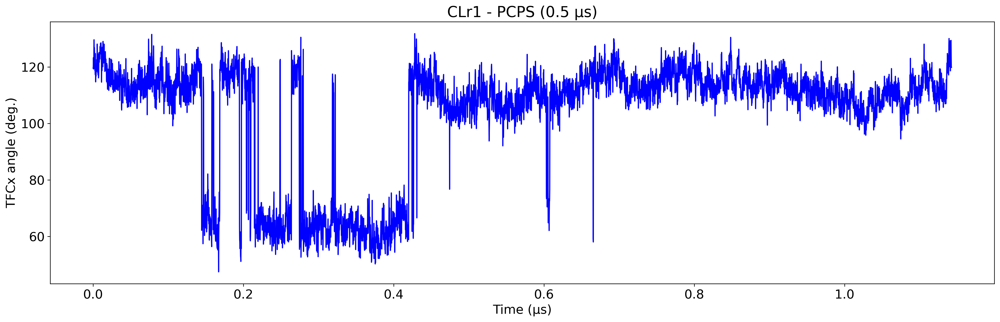

In [20]:
#CLpsr1a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/TFN_TFC_test/CL_PCPSna_TFN_TFCal_angle_1us_200ps.dat'
#CLpsr1a_all = np.genfromtxt(CLpsr1a, usecols=(0,1))
#CLpsr1a_eq = np.genfromtxt(CLpsr1a, usecols=(0,1), skip_header=399)

CLpsr2a= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/TFN_TFC_test/CL_PCPSna_r1_TFN_TFCal_angle_1us_200ps_zalPN.dat'

#TFN_p = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/TFN_TFC_test/CL_PCPSna_TFNproj_1us_200ps.dat'

#TFC_p = '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/angle/TFN_TFC_test/CL_PCPSna_TFCproj_1us_200ps.dat'

#TFN_xpo = np.genfromtxt(TFN_p, usecols=(0,1))
#TFN_xpm = np.genfromtxt(TFN_p, usecols=(0,4))
#TFN_ypo = np.genfromtxt(TFN_p, usecols=(0,2))
#TFN_ypm = np.genfromtxt(TFN_p, usecols=(0,5))
#
#FC_xpo = np.genfromtxt(TFC_p, usecols=(0,1))
#FC_xpm = np.genfromtxt(TFC_p, usecols=(0,4))
#FC_ypo = np.genfromtxt(TFC_p, usecols=(0,2))
#FC_ypm = np.genfromtxt(TFC_p, usecols=(0,5))


CLpsr2a1_all = np.genfromtxt(CLpsr2a, usecols=(0,1))
#CLpsr2a3_all = np.genfromtxt(CLpsr2a, usecols=(0,2))
#CLpsr2a4_all = np.genfromtxt(CLpsr2a, usecols=(0,3))
#CLpsr2a5_all = np.genfromtxt(CLpsr2a, usecols=(0,4))
#CLpsr2a6_all = np.genfromtxt(CLpsr2a, usecols=(0,5))


#CLpsr2a_eq = np.genfromtxt(CLpsr2a, usecols=(0,2), skip_header=399)




## Rolling window avg ##

def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

plt.figure( figsize = (18,6)) 
#Rolling averages -- time evol
#ravCLpsr1=np.mean(rolling_window(CLpsr1a_all, 20), 1)
ravCLpsr2=np.mean(rolling_window(CLpsr2a1_all, 20), 1)

#CL_pcps r1
plt.subplot(111)
#plt.plot((CLpsr1a_all[:,0]*0.0002),(CLpsr1a_all[:,1]), color='gray', alpha=0.5)
#plt.plot((ravCLpsr1[:,0]*0.0002),(ravCLpsr1[:,1]), color='red')
plt.plot((CLpsr2a1_all[:,0]*0.0002),(CLpsr2a1_all[:,1]), color='blue', alpha=1)
#plt.plot((CLpsr2a4_all[:,0]*0.0002),(CLpsr2a4_all[:,1]), color='red', alpha=1)
#plt.plot((CLpsr2a5_all[:,0]*0.0002),(CLpsr2a5_all[:,1]), color='green', alpha=1)
#plt.plot((CLpsr2a6_all[:,0]*0.0002),(CLpsr2a6_all[:,1]), color='purple', alpha=1)



#plt.plot((ravCLpsr2[:,0]*0.0002),(ravCLpsr2[:,1]), color='blue')
plt.xlabel('Time (µs)')
#plt.xlim([0, 0.1])
#plt.ylim([40, 160])
plt.ylabel('TFCx angle (deg.)')
plt.title('CLr1 - PCPS (0.5 µs)')
#plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

#plt.subplot(132)
#plt.plot((TFN_xpo[:,0]*0.0002),(TFN_xpo[:,1]), color='orange', alpha=0.8)
#plt.plot((TFC_xpo[:,0]*0.0002),(TFC_xpo[:,1]), color='blue', alpha=0.8)
##plt.plot((TFN_ypo[:,0]*0.0002),(TFN_ypo[:,1]), color='green', alpha=0.8)
##plt.plot(TFN_xpo[:,1],TFN_ypo[:,1], color='green', alpha=0.8)
##plt.plot(TFN_xpm[:,1],TFN_ypm[:,1], color='orange', alpha=0.8)
##plt.plot((ravCLpsr1[:,0]*0.0002),(ravCLpsr1[:,1]*57.2958), color='red')
#plt.xlabel('Time (µs)')
#plt.xlim([0, 0.1])
##plt.ylim([40, 160])
##plt.ylabel('TFCx angle (deg.)')
##plt.title('CLr1 - PCPS (0.5 µs)')
##plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)
#
#plt.subplot(133)
#plt.plot((TFN_ypm[:,0]*0.0002),(TFN_ypm[:,1]), color='orange', alpha=0.8)
#plt.plot((TFC_ypm[:,0]*0.0002),(TFC_ypm[:,1]), color='blue', alpha=0.8)
##plt.plot((TFC_ypo[:,0]*0.0002),(TFC_ypo[:,1]), color='red', alpha=0.8)
##plt.plot(TFC_xpo[:,1],TFC_ypo[:,1], color='blue', alpha=0.8)
##plt.plot((ravCLpsr1[:,0]*0.0002),(ravCLpsr1[:,1]*57.2958), color='red')
#plt.xlabel('Time (µs)')
#plt.xlim([0, 0.1])
##plt.ylim([40, 160])
##plt.ylabel('TFCx angle (deg.)')
##plt.title('CLr1 - PCPS (0.5 µs)')
##plt.vlines(0.2, 40, 160, colors='k', linestyles='solid',zorder=6)

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/FVIIac_TFcl1us_angles_Oct2020.pdf", dpi=300)
plt.show()


## FVIIa - Active site distance

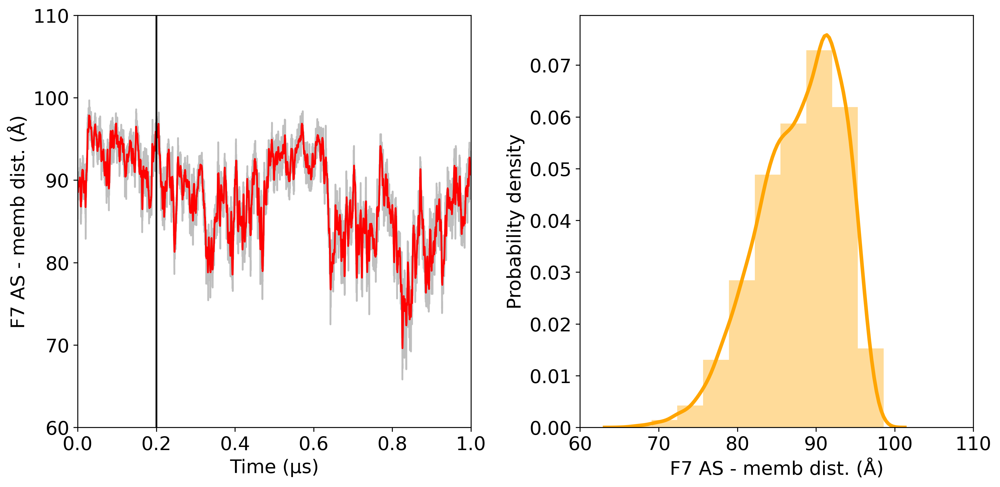

In [26]:
## F7 AS dist ##

file_AS =  '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/AS/TFF7pcps_F7_ASdist_100ps_s7_1us.dat'

ASdz = np.genfromtxt(file_AS, usecols=(0,4))

## Eq
ASdz_eq = np.genfromtxt(file_AS, usecols=(0,4),skip_header=399)

## Fig ##

plt.figure( figsize = (12,6)) 

#CLpcps
dasz=ASdz
madasz=np.mean(rolling_window(dasz, 20), 1)
plt.subplot(121)
plt.plot((dasz[:,0]*0.0001),(dasz[:,1]), color='gray', alpha=0.5)
plt.plot((madasz[:,0]*0.0001),(madasz[:,1]), color='red')
plt.xlabel('Time (µs)')
plt.xlim([0, 1])
plt.ylim([60, 110])
plt.ylabel('F7 AS - memb dist. (Å)')
#plt.title('FVIIa-TF - PCPS (0.5 µs)')
plt.vlines(0.2, 60, 120, colors='k', linestyles='solid',zorder=6)

dasz_eq=ASdz_eq
plt.subplot(122)
sns.distplot((dasz_eq[:,1]), bins=10, hist = True, kde = True, kde_kws = {'linewidth': 3}, color='orange')
plt.xlabel('F7 AS - memb dist. (Å)')
plt.ylabel('Probability density')
#plt.title('FVIIa-TF - PCPS (0.5 µs)')
plt.xlim([60, 110])
#plt.ylim([0, 0.07])

plt.tight_layout()  
plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/plots_jan21/TF_F7_psps_F7AS_dist_130121.pdf", dpi=300)
plt.show()

87.85821163102685 1.3963642593938503


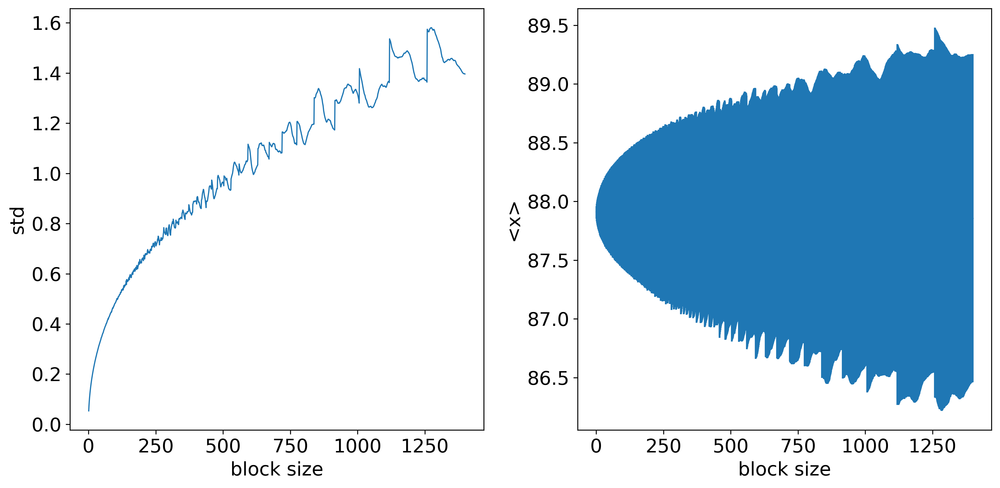

In [36]:
blockAverage(ASdz_eq[:,1],maxBlockSize=1400)

## RMSD 

In [ ]:

## TF-F7 RMSD ##

## Column def. #

# Col 0 --> frame
# Col 1 --> RMSD all prot aligned
# Col 2 --> ECD_alprot 
# Col 3 --> tfn_alprot
# Col 4 --> tfc_alprot
# Col 5 --> linker_alprot
# Col 6 --> tmd_altmd
# Col 7 --> prot_alTMD
# Col 8 --> ecd_alTMD
# Col 9 --> ECD_alECD
# Col 10--> TFN_alTFN 
# Col 11--> TFC_alTFN 
# Col 12--> TFC_alTFC 
# Col 13--> TFN_alTFC 
# Col 14--> linker_allinker
# Col 15--> F7_alF7 
# Col 16--> F7L_alF7L 
# Col 17--> F7H_alF7H 
# Col 18--> GLA_alGLA


F7_TF_rmsd= '/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/FVIIac_TFCLinit_glyc_PCPS/RMS/FVIIac_TFCLinit_RMSD.dat'

RMSD_F7TF = np.genfromtxt(F7_TF_rmsd, usecols=(0,1,9,14,6,7,15,16,17,18))

plt.figure( figsize = (12,6)) 

rm1=RMSD_F7TF
ma_rm1=np.mean(rolling_window(rm1, 100), 1)
plt.subplot(121)
plt.plot((rm1[:,0]*0.0001),rm1[:,1], color='C0', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,2], color='C1', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,3], color='C2', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,4], color='C3', alpha=0.4)
#plt.plot((rm1[:,0]*0.0001),rm1[:,5], color='C4', alpha=0.4)

plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,1], color='C0', label='TF')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,2], color='C1', label='ECD')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,3], color='C2', label='Linker')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,4], color='C3', label='TMD')
#plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,5], color='C4', label='ECD_alTMD')

plt.xlim([0, 0.55])
plt.ylim([0, 10])
plt.xlabel('Time (µs)')
plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
plt.legend(loc='best', frameon = False)

plt.subplot(122)
plt.plot((rm1[:,0]*0.0001),rm1[:,6], color='C5', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,7], color='C6', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,8], color='C7', alpha=0.4)
plt.plot((rm1[:,0]*0.0001),rm1[:,9], color='C8', alpha=0.4)

plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,6], color='C5', label='F7')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,7], color='C6', label='F7_L')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,8], color='C7', label='F7_H')
plt.plot((ma_rm1[:,0]*0.0001),ma_rm1[:,9], color='C8', label='GLA')

plt.xlim([0, 0.55])
plt.ylim([0, 10])
plt.xlabel('Time (µs)')
plt.ylabel('RMSD C-' r'$\alpha$' ' (Å)')
plt.legend(loc='best', frameon = False)

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/FVIIac_TFcl1us_angles_Oct2020.pdf", dpi=300)
plt.show()



## PS density map

In [3]:


# CL PCPS

TFCL_PS   = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/CL_1us_pcps_s200ns_200ps_HGPSdens.dx')
TFCL_prot = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/CL_1us_pcps_s200ns_200ps_TFdens1A.dx')
TFCL_ECD  = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/CL_1us_pcps_s200ns_200ps_ECDdens1A.dx')
TFCL_TMD  = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/CL_1us_pcps_s200ns_200ps_TMDdens1A.dx')

TF_F7_pcps  = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_HGPSdens.dx')
TF_F7_prot  = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_PROTdens1A.dx')
TF_F7_TFecd = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TFECD1Adens.dx')
TF_F7_F7    = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_F7dens1A.dx')
#TF_F7_TF    = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/')
TF_F7_TMD   = Grid('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TMDdens1A.dx')



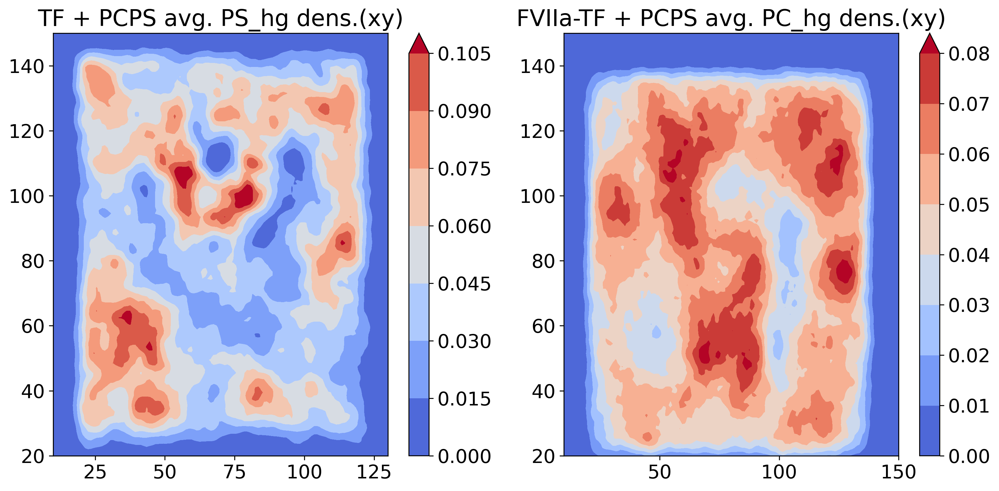

In [20]:
norm = cm.colors.Normalize(vmax=0.11)
norm2 = cm.colors.Normalize(vmax=0.08)
plt.figure( figsize = (12,6) )

#plt.subplot(121)
#grid1 = TFCL_ECD.grid
#sum_vec1 = np.sum(grid1, axis=2)
#rotX = np.rot90(sum_vecX)    
#cfE = plt.contourf(rotE, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
#cfX = plt.contourf(sum_vec1, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
#plt.colorbar( cfX )
#plt.title('TF + PCPS avg. PS_hg dens.(xy)')
#plt.xlim([10, 130])
#plt.ylim([20, 150])

plt.subplot(121)
gridX = TFCL_PS.grid
sum_vecX = np.sum(gridX, axis=2)
rotX = np.rot90(sum_vecX)    
#cfE = plt.contourf(rotX, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
cfX = plt.contourf(sum_vecX, origin='upper', levels=10, cmap = 'coolwarm',extend='max', norm=norm)
plt.colorbar( cfX )
plt.title('TF + PCPS avg. PS_hg dens.(xy)')
plt.xlim([10, 130])
plt.ylim([20, 150])

#####
#plt.subplot(223)
#grid2 = TF_F7_prot.grid
#sum_vec2 = np.sum(grid2, axis=2)
#rotX = np.rot90(sum_vecX)    
#cfE = plt.contourf(rotE, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
#cfX = plt.contourf(sum_vec2, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
#plt.colorbar( cfX )
#plt.title('TF + PCPS avg. PS_hg dens.(xy)')
#plt.xlim([10, 130])
#plt.ylim([20, 150])

plt.subplot(122)
gridY = TF_F7_pcps.grid
sum_vecY = np.sum(gridY, axis=2)
#rotX = np.rot90(sum_vecX)    
#cfE = plt.contourf(rotE, origin='upper', levels=10, cmap = 'coolwarm',extend='max')
cfY = plt.contourf(sum_vecY, origin='upper', levels=10, cmap = 'coolwarm',extend='max', norm=norm2)
plt.colorbar( cfY )
plt.title('FVIIa-TF + PCPS avg. PC_hg dens.(xy)')
plt.xlim([10, 150])
plt.ylim([20, 150])

plt.tight_layout()  
plt.show()

## Prot dens profiles -- tests

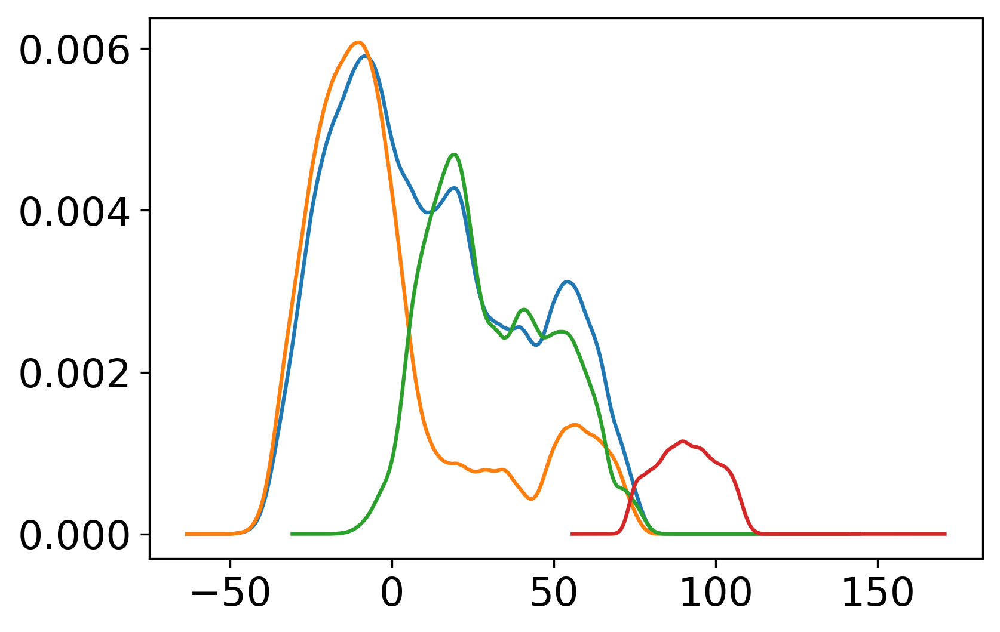

In [98]:
## Test new density profiles ## 

# Processed Dx with volutil #

ECDt=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_ECdens.dx_z.dat')

F7ecd= np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_F7dens.dx_z.dat')

TFecd= np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TFECDdens.dx_z.dat')
 
TM=    np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TMDdens.dx_z.dat')

plt.plot (ECDt[:,0],ECDt[:,1])
plt.plot (F7ecd[:,0],F7ecd[:,1])
plt.plot (TFecd[:,0],TFecd[:,1])
plt.plot (TM[:,0],TM[:,1])

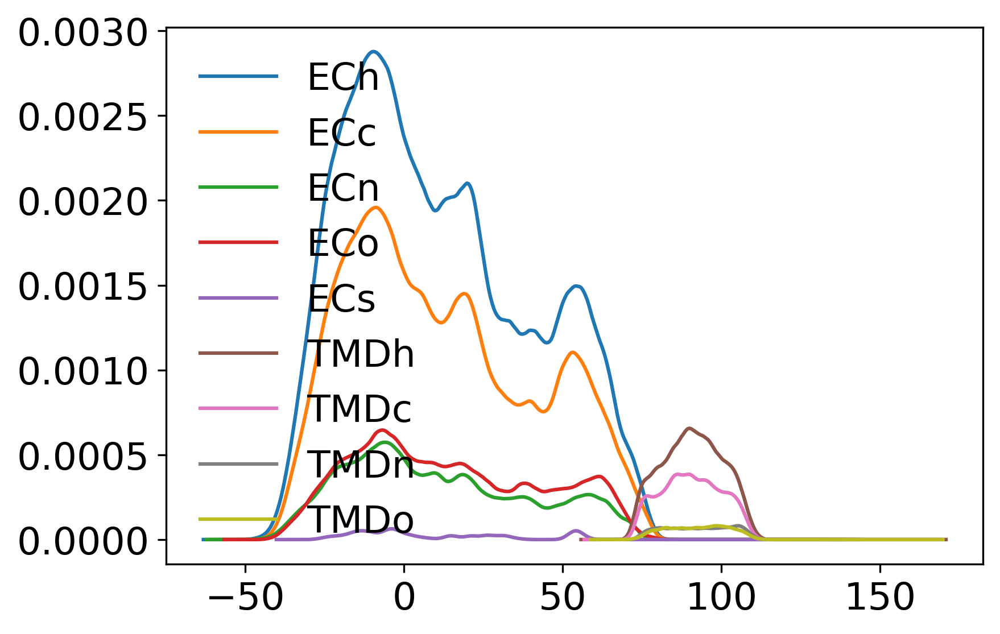

In [107]:
#ECDt=  np.genfromtxt('FVIIaTFcl_pcps1us_pcps_s200ns_200ps_ECdens.dx_z.dat ') 
ECh=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_ECh_dens.dx_z.dat')
ECn=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_ECn_dens.dx_z.dat')
ECo=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_ECo_dens.dx_z.dat')
ECs=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_ECs_dens.dx_z.dat')
ECc=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_ECc_dens.dx_z.dat')

#ECDt=  np.genfromtxt('FVIIaTFcl_pcps1us_pcps_s200ns_200ps_F7dens.dx_z.dat')
HGPS=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_HGPSdens.dx_z.dat')
Pd=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_Pdens.dx_z.dat')
#ECDt=  np.genfromtxt('FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TFECDdens.dx_z.dat')
TMDc=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TMDc_dens.dx_z.dat')
#ECD=  np.genfromtxt('FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TMDdens.dx_z.dat')
TMDh=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TMDh_dens.dx_z.dat')
TMDn=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TMDn_dens.dx_z.dat')
TMDo=  np.genfromtxt('/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/forMS/dens/FVIIaTFcl_pcps1us_pcps_s200ns_200ps_TMDo_dens.dx_z.dat')

plt.plot (ECh[:,0],ECh[:,1], label='ECh')
plt.plot (ECc[:,0],ECc[:,1], label='ECc')
plt.plot (ECn[:,0],ECn[:,1], label='ECn')
plt.plot (ECo[:,0],ECo[:,1], label='ECo')
plt.plot (ECs[:,0],ECs[:,1], label='ECs')

plt.plot (TMDh[:,0],TMDh[:,1], label='TMDh')
plt.plot (TMDc[:,0],TMDc[:,1], label='TMDc')
plt.plot (TMDn[:,0],TMDn[:,1], label='TMDn')
plt.plot (TMDo[:,0],TMDo[:,1], label='TMDo')


plt.legend(loc='best', frameon = False)

plt.tight_layout()  
#plt.savefig("/media/4TB_HDD/raul/projects/synergy/TF_EC_TMD/AA/w_SSbs/results/figs/FVIIac_TFcl1us_angles_Oct2020.pdf", dpi=300)
plt.show()